In [33]:
#Astropy
import astropy
from astropy.io import fits
from astropy.table import Table

# Dlnpyutils
from dlnpyutils import utils

# Matplotlib
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
matplotlib.rcParams.update({'font.size': 25})

#Numpy/Scipy
import numpy as np
from scipy.interpolate import InterpolatedUnivariateSpline as IUS
from scipy.interpolate import interp1d, interp2d
from scipy.optimize import curve_fit
from scipy.stats import binned_statistic, binned_statistic_2d

### TQDM
from tqdm import tqdm_notebook

In [2]:
def fitz_alebv(wave):
    '''
    Fitzpatrick 1999 extinction law
    '''
    recip_anchors = np.array([0.000,0.377,0.820,1.667,1.828,2.141,2.433,3.704,3.846])#[:-2]
    alebv_anchors = np.array([0.000,0.265,0.829,2.688,3.055,3.806,4.315,6.265,6.591])#[:-2]

    x=1/wave
    spl = interp1d(recip_anchors,alebv_anchors)
    alebv = spl(x)
    return alebv

leff = {'BP':0.5387,'G':0.6419,'RP':0.7667,'J':1.2345,'H':1.6393,'K':2.1757}
def ccm_a(x):
    '''
    a(x) function from Cardelli et al. 1989
    
    Input:
    -----
        x: effective wavelength in units of 1/micron
        
    Output:
    ------
        a: a function value  
    '''
    if 0.3 <= x < 1.1:
        a = 0.574*(x**1.61)
        return a
    
    elif 1.1 <= x < 3.3:
        y = x - 1.82
        a = (1.+0.17699*y-0.50477*(y**2)-0.02427*(y**3)+0.72085*(y**4)+
                0.01979*(y**5)-0.77530*(y**6)+0.32999*(y**7))
        return a
    
    elif 3.3 <= x < 8.0:
        if x < 5.9:
            a = 1.752-0.136*x-0.104/((x-4.67)**2+0.341)
            return a
        
        else:
            fa = -0.04473*((x-5.9)**2)+0.1207*((x-5.9)**3)
            a = 1.752-0.136*x-0.104/((x-4.67)**2+0.341)+fa
            return a       
    
def ccm_b(x):
    '''
    b(x) function from Cardelli et al. 1989
    
    Input:
    -----
        x: effective wavelength in units of 1/micron
        
    Output:
    ------
        b: b function value 
    '''
    if 0.3 <= x < 1.1:
        b = -0.527*(x**1.61)
        return b
    
    elif 1.1 <= x <= 3.3:
        y = x - 1.82
        b = (1.41338*y+2.28305*(y**2)+1.07233*(y**3)-5.38434*(y**4)-
                0.62251*(y**5)+5.30260*(y**6)-2.09002*(y**7))
        return b
    
    elif 3.3 <= x < 8.0:
        if x < 5.9:
            b = -3.090+1.825*x+1.206/((x-4.62)**2+0.263)
            return b
        
        else:
            fb = 0.2130*((x-5.9)**2)+0.1207*((x-5.9)**3)
            b = -3.090+1.825*x+1.206/((x-4.62)**2+0.263)+fb
            return b
    
def ccm_alav(wave,rv):
    '''
    Calculate A\lambda/Av
    
    Inputs:
    ------
        wave: effective wavelength in units of micron
        rv: Rv value (=Av/E(B_V))
        
    Output:
    ------
        alav: A\lambda/Av
    '''
    x=1/wave
    alav = ccm_a(x)+ccm_b(x)/rv
    return alav

ejk_ak = (ccm_alav(leff['J'],3.1)-ccm_alav(leff['K'],3.1))/ccm_alav(leff['K'],3.1)
ebv_ak = (ccm_alav(0.445,3.1)-ccm_alav(0.551,3.1))/ccm_alav(leff['K'],3.1)

def closest(data,value):
    '''
    Find nearest value in array to given value
        
    Inputs:
    ------
        data: data to search through 
        value: value of interest
    '''
        
    data = np.asarray(data)
    return data[(np.abs(np.subtract(data,value))).argmin()]

def neighbors(data,value):
    '''
    Find values of two elements closest to the given value

    Inputs:
    ------
        data: data to search through 
        value: value of interest

    Output:
    ------
        close1: closest value under the given value
        close2: closest value over the given value
    '''

    data = np.asarray(data)
    close1 = data[(np.abs(np.subtract(data,value))).argmin()]
    data = data[np.where(data!=close1)]
    close2 = data[(np.abs(np.subtract(data,value))).argmin()]

    return close1,close2

def mad(dat):
    return np.nanmedian(np.abs(dat-np.nanmedian(dat)))

# PARSEC 

In [3]:
massive = fits.getdata('/Users/joshuapovick/Desktop/Research/parsec/parsec_massive_lite.fits.gz')
massive = Table(massive[np.where(massive['label']==3.0)])
massive['index'] = np.arange(len(massive))
massive = massive[np.argsort(massive['logAge'])]
massive = massive['index','MH','Mass','logAge','logTe','logg','Gmag','G_BPmag','G_RPmag','Jmag','Hmag','Ksmag']

# APOKASC 

In [4]:
dr17 = fits.getdata('/Users/joshuapovick/Desktop/Research/fits/allStar-dr17-synspec.fits.gz')
# apoafe = dr17['ALPHA_M']+dr17['M_H']-dr17['FE_H']
# apoafe_err = np.sqrt(dr17['ALPHA_M']**2+dr17['M_H']**2-dr17['FE_H']**2)

# # 0.659, 0.341 from Asplund et al 2021.
# salfeh = dr17['FE_H']+np.log10(0.659*(10**(apoafe))+0.341)
# salfeh_err = np.sqrt(dr17['FE_H_ERR']**2+((1-0.341/(0.659*(10**(apoafe))+0.341))*apoafe_err)**2)

# https://iopscience.iop.org/article/10.3847/1538-3881/aba592/pdf

cn = dr17['FPARAM'][:,4]-dr17['FPARAM'][:,5]
dt = dr17['TEFF_SPEC'] - (4400.+552.6*(dr17['LOGG_SPEC']-2.5)-324.6*dr17['FPARAM'][:,3])

rc = dr17[np.where((dr17['FPARAM'][:,1]>2.38)&(dr17['FPARAM'][:,1]<3.5)&
                   (cn>0.04-0.46*dr17['FPARAM'][:,3]-0.0028*dt))]

rgb = dr17[np.where((dr17['FPARAM'][:,1]<3.5)&(dr17['FPARAM'][:,0]<6000.)&
                    (np.isin(dr17['APOGEE_ID'],rc['APOGEE_ID'])==False))]

rgb_salfeh = salfeh[np.where((dr17['FPARAM'][:,1]<3.5)&(dr17['FPARAM'][:,0]<6000.)&
                    (np.isin(dr17['APOGEE_ID'],rc['APOGEE_ID'])==False))]
rgb_salfeh_err = salfeh_err[np.where((dr17['FPARAM'][:,1]<3.5)&(dr17['FPARAM'][:,0]<6000.)&
                    (np.isin(dr17['APOGEE_ID'],rc['APOGEE_ID'])==False))]
rgb_apoafe = apoafe[np.where((dr17['FPARAM'][:,1]<3.5)&(dr17['FPARAM'][:,0]<6000.)&
                    (np.isin(dr17['APOGEE_ID'],rc['APOGEE_ID'])==False))]
rgb_apoafe_err = apoafe_err[np.where((dr17['FPARAM'][:,1]<3.5)&(dr17['FPARAM'][:,0]<6000.)&
                    (np.isin(dr17['APOGEE_ID'],rc['APOGEE_ID'])==False))]


# Get rid of stars with any ASPCAP flag and high extinction
rgb_salfeh[np.where((rgb['ASPCAPFLAG']==0))]
rgb_salfeh_err[np.where((rgb['ASPCAPFLAG']==0))]
rgb_apoafe[np.where((rgb['ASPCAPFLAG']==0))]
rgb_apoafe_err[np.where((rgb['ASPCAPFLAG']==0))]
rgb = rgb[np.where((rgb['ASPCAPFLAG']==0))]

<ipython-input-4-148ea7940832>:3: RuntimeWarning: invalid value encountered in sqrt
  apoafe_err = np.sqrt(dr17['ALPHA_M']**2+dr17['M_H']**2-dr17['FE_H']**2)


# Gaia EDR3

In [5]:
gaiaedr3 = fits.getdata('/Users/joshuapovick/Desktop/Research/gaia/GAIAEDR3allStar.fits.gz')

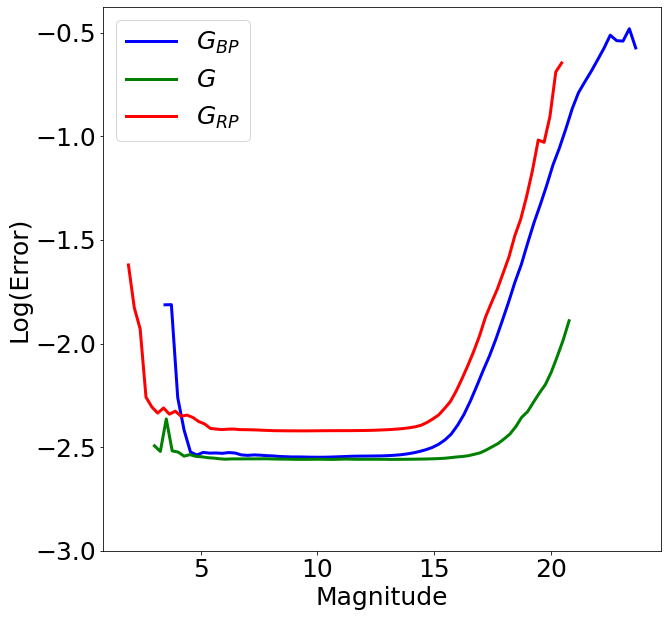

In [6]:
binnum = 75

### BP
bp_fin = np.where(np.isfinite(gaiaedr3['phot_bp_mean_mag'])==True)

bpmin = min(gaiaedr3['phot_bp_mean_mag'][bp_fin])
bpmax = max(gaiaedr3['phot_bp_mean_mag'][bp_fin])

bpdiff = bpmax-bpmin
bpfluxerr = (2.5*0.434)/gaiaedr3['phot_bp_mean_flux_over_error'][bp_fin]
bpmagerr = np.sqrt((bpfluxerr)**2+0.0027901700**2)

bpbin ,_,_ = binned_statistic(gaiaedr3['phot_bp_mean_mag'][bp_fin],np.log10(bpmagerr),'median',bins=binnum)

### G
g_fin = np.where(np.isfinite(gaiaedr3['phot_g_mean_mag'])==True)

gmin = min(gaiaedr3['phot_g_mean_mag'][g_fin])
gmax = max(gaiaedr3['phot_g_mean_mag'][g_fin])

gdiff = gmax-gmin
gfluxerr = (2.5*0.434)/gaiaedr3['phot_g_mean_flux_over_error'][g_fin]
gmagerr = np.sqrt((gfluxerr)**2+0.0027553202**2)

gbin ,_,_ = binned_statistic(gaiaedr3['phot_g_mean_mag'][g_fin],np.log10(gmagerr),'median',bins=binnum)

### RP 
rp_fin = np.where(np.isfinite(gaiaedr3['phot_rp_mean_mag'])==True)

rpmin = min(gaiaedr3['phot_rp_mean_mag'][rp_fin])
rpmax = max(gaiaedr3['phot_rp_mean_mag'][rp_fin])

rpdiff = rpmax-rpmin
rpfluxerr = (2.5*0.434)/gaiaedr3['phot_rp_mean_flux_over_error'][rp_fin]
rpmagerr = np.sqrt((rpfluxerr)**2+0.0037793818**2)

rpbin ,_,_ = binned_statistic(gaiaedr3['phot_rp_mean_mag'][rp_fin],np.log10(rpmagerr),'median',bins=binnum)

### Plot
plt.figure(figsize=[10,10])
plt.plot(np.arange(bpmin,bpmax,bpdiff/binnum),bpbin,lw=3.0,c='blue',label=r'$G_{BP}$')
plt.plot(np.arange(gmin,gmax,gdiff/binnum),gbin,lw=3.0,c='green',label=r'$G$')
plt.plot(np.arange(rpmin,rpmax,rpdiff/binnum),rpbin,lw=3.0,c='red',label=r'$G_{RP}$')
plt.legend()
plt.ylim(bottom=-3.0)
plt.xlabel('Magnitude')
plt.ylabel('Log(Error)')
plt.savefig('../plots/gaiaerrorcurve.pdf',dpi=300,bbox_inches='tight');

bperrfunc = IUS(np.arange(bpmin,bpmax,bpdiff/binnum),bpbin)
gerrfunc = IUS(np.arange(gmin,gmax,gdiff/binnum),gbin)
rperrfunc = IUS(np.arange(rpmin,rpmax,rpdiff/binnum),rpbin)

### Replace nan's with zeropoint error
bperr = np.nan_to_num(10**bperrfunc(rgb['GAIAEDR3_PHOT_BP_MEAN_MAG']),nan=0.0027901700)
gerr = np.nan_to_num(10**gerrfunc(rgb['GAIAEDR3_PHOT_G_MEAN_MAG']),nan=0.0027553202)
rperr = np.nan_to_num(10**rperrfunc(rgb['GAIAEDR3_PHOT_RP_MEAN_MAG']),nan=0.0037793818)

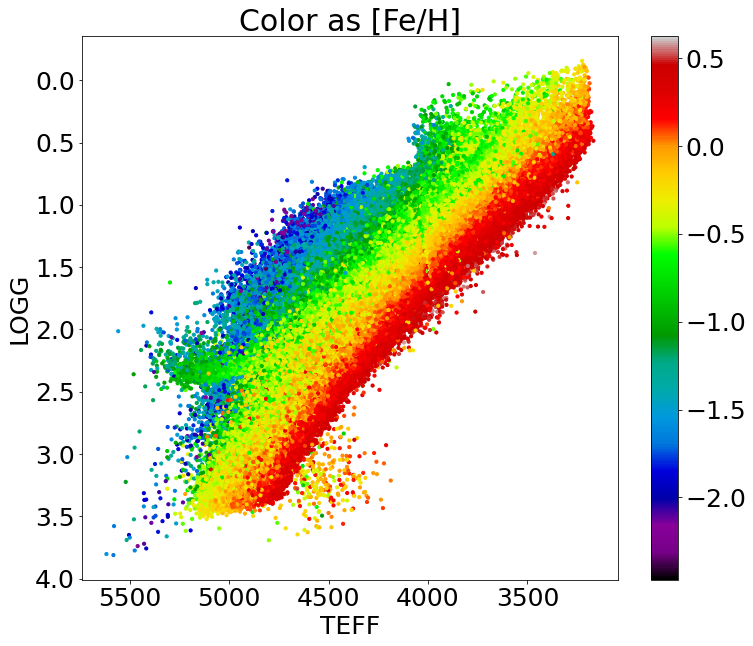

In [7]:
plt.figure(figsize=[12,10])
plt.scatter(rgb['TEFF'],rgb['LOGG'],c=rgb['FE_H'],cmap='nipy_spectral',s=10)
plt.colorbar()

plt.gca().invert_xaxis()
plt.gca().invert_yaxis()

plt.title(r'Color as [Fe/H]')
plt.xlabel(r'TEFF')
plt.ylabel(r'LOGG');

In [25]:
len(np.squeeze(np.where((rgb['AK_TARG']<0.01)&(rgb['SFD_EBV']<0.02))))

9934

(0.0, 0.01)

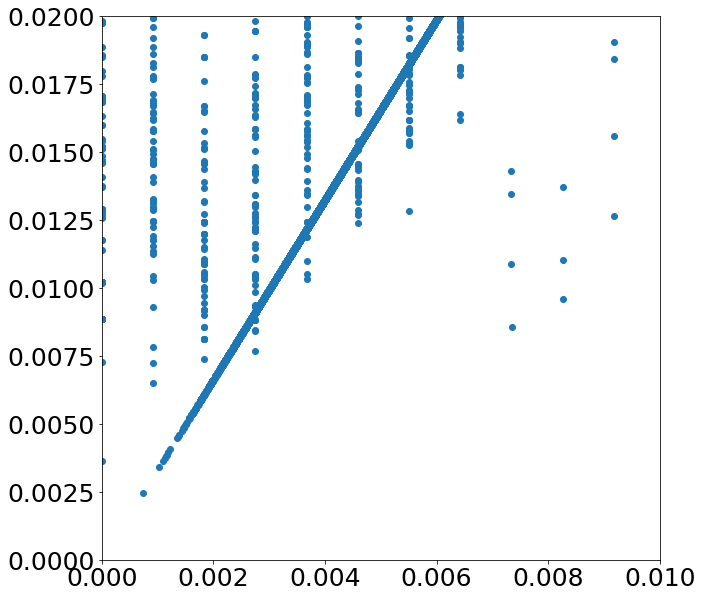

In [26]:
plt.figure(figsize=[10,10])
plt.scatter(rgb['AK_TARG'],rgb['SFD_EBV'])
plt.ylim(0,0.02)
plt.xlim(0,0.01)

(array([ 5537., 11390., 13869., 13111.,  9376.,  5857.,  4421.,  4075.,
         3990.,  3174.,  2818.,  2774.,  2364.,  2669.,  2250.,  2033.,
         2464.,  2048.,  1999.,  2360.,  2003.,  1919.,  2198.,  1823.,
         1806.]),
 array([0.   , 0.004, 0.008, 0.012, 0.016, 0.02 , 0.024, 0.028, 0.032,
        0.036, 0.04 , 0.044, 0.048, 0.052, 0.056, 0.06 , 0.064, 0.068,
        0.072, 0.076, 0.08 , 0.084, 0.088, 0.092, 0.096, 0.1  ],
       dtype=float32),
 <a list of 25 Patch objects>)

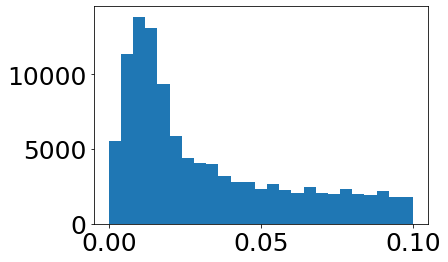

In [12]:
plt.hist(rgb['AK_TARG'],range=(0,0.1),bins=25)

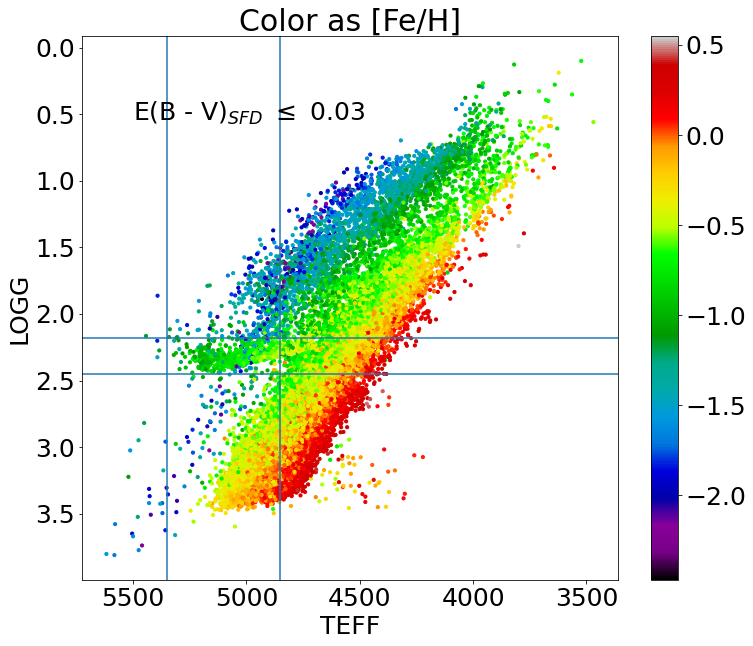

In [268]:
# low_ak = np.where((rgb['AK_TARG']<=0.0075)&(rgb['SFD_EBV']<=0.02)&(rgb['J']-rgb['K']>0.25))

# low_ak = np.where((rgb['AK_TARG']<=0.01)&(rgb['SFD_EBV']<=0.02)&(rgb['J']-rgb['K']>0.25))
low_ak = np.where((rgb['SFD_EBV']<=0.03)&(rgb['J']-rgb['K']>0.25))

plt.figure(figsize=[12,10])
plt.scatter(rgb['TEFF'][low_ak],rgb['LOGG'][low_ak],c=rgb['FE_H'][low_ak],cmap='nipy_spectral',s=10)
plt.colorbar()

plt.axhline(2.45)
plt.axhline(2.18)

plt.axvline(4850)
plt.axvline(5350)

plt.gca().invert_xaxis()
plt.gca().invert_yaxis()

# plt.text(5500,0.25,r'AK_TARG $\leq$ 0.01')
# plt.text(5500,0.55,r'E(B - V)$_{F99}$ $\leq$ 0.0203')
plt.text(5500,0.55,r'E(B - V)$_{SFD}$ $\leq$ 0.03')

plt.title(r'Color as [Fe/H]')
plt.xlabel(r'TEFF')
plt.ylabel(r'LOGG');

<ipython-input-389-741f4b1e2a22>:28: RuntimeWarning: invalid value encountered in sqrt
  low_ext_afe_err = np.sqrt(low_ext_rgb['ALPHA_M']**2+low_ext_rgb['M_H']**2-low_ext_rgb['FE_H']**2)


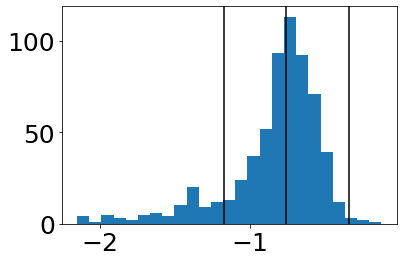

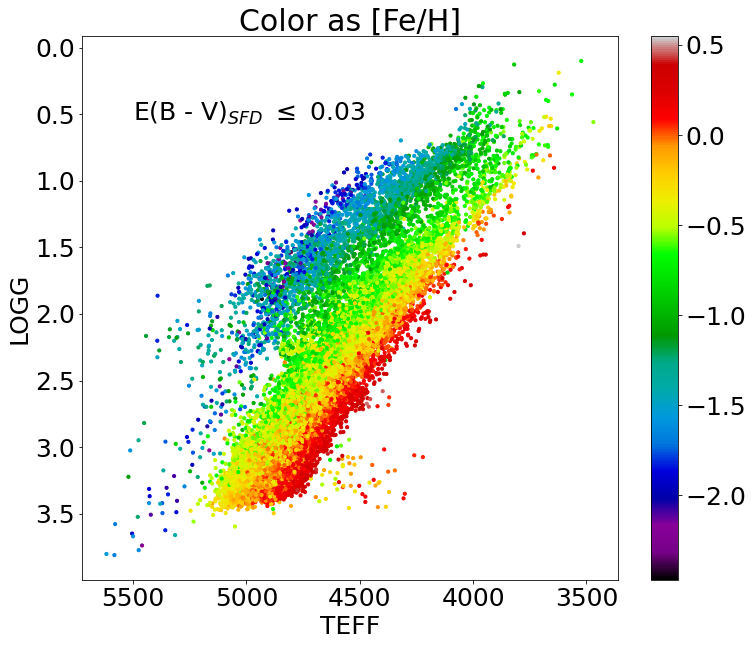

In [389]:
remain_rc_box = np.where((rgb[low_ak]['TEFF']<5350)&(rgb[low_ak]['TEFF']>=4850)&
                         (rgb[low_ak]['LOGG']<2.45)&(rgb[low_ak]['LOGG']>=2.18))

plt.hist(rgb[low_ak][remain_rc_box]['FE_H'],bins=25)

plt.axvline(np.nanmedian(rgb[low_ak][remain_rc_box]['FE_H']),c='k')
plt.axvline(np.nanmedian(rgb[low_ak][remain_rc_box]['FE_H'])+3*mad(rgb[low_ak][remain_rc_box]['FE_H']),c='k')
plt.axvline(np.nanmedian(rgb[low_ak][remain_rc_box]['FE_H'])-3*mad(rgb[low_ak][remain_rc_box]['FE_H']),c='k')

remain_rc_box2 = np.where((rgb[low_ak]['TEFF']<5350)&(rgb[low_ak]['TEFF']>=4850)&
                         (rgb[low_ak]['LOGG']<2.45)&(rgb[low_ak]['LOGG']>=2.18)&
                         (rgb[low_ak]['FE_H']>=np.nanmedian(rgb[low_ak][remain_rc_box]['FE_H'])-
                          3*mad(rgb[low_ak][remain_rc_box]['FE_H'])))

resid_rc_cut = np.where(np.isin(rgb[low_ak]['APOGEE_ID'],rgb[low_ak][remain_rc_box2]['APOGEE_ID'])==False)

### Low Ext
low_ext_rgb = rgb[low_ak][resid_rc_cut] # APOGEE
low_ext_bperr = bperr[low_ak][resid_rc_cut] # Gaia BP err
low_ext_gerr = bperr[low_ak][resid_rc_cut] # Gaia G err
low_ext_rperr = rperr[low_ak][resid_rc_cut] # Gaia RP err
# low_ext_afe = rgb_apoafe[low_ak][resid_rc_cut] # [alpha/Fe]
# low_ext_afe_err = rgb_apoafe_err[low_ak][resid_rc_cut] # [alpha/Fe] err
# low_ext_salfeh = rgb_salfeh[low_ak][resid_rc_cut] # Salaris [Fe/H]
# low_ext_salfeh_err = rgb_salfeh_err[low_ak][resid_rc_cut] # Salaris [Fe/H] err

low_ext_afe = low_ext_rgb['ALPHA_M']+low_ext_rgb['M_H']-low_ext_rgb['FE_H']
low_ext_afe_err = np.sqrt(low_ext_rgb['ALPHA_M']**2+low_ext_rgb['M_H']**2-low_ext_rgb['FE_H']**2)

# 0.659, 0.341 from Asplund et al 2021.
low_ext_salfeh = low_ext_rgb['FE_H']+np.log10(0.659*(10**(low_ext_afe))+0.341)
low_ext_salfeh_err = np.sqrt(low_ext_rgb['FE_H_ERR']**2+
                             ((1-0.341/(0.659*(10**(low_ext_afe))+0.341))*low_ext_afe_err)**2)



plt.figure(figsize=[12,10])
plt.scatter(low_ext_rgb['TEFF'],low_ext_rgb['LOGG'],c=low_ext_rgb['FE_H'],cmap='nipy_spectral',s=10)
plt.colorbar()

plt.gca().invert_xaxis()
plt.gca().invert_yaxis()

plt.text(5500,0.55,r'E(B - V)$_{SFD}$ $\leq$ 0.03')

plt.title(r'Color as [Fe/H]')
plt.xlabel(r'TEFF')
plt.ylabel(r'LOGG');

In [390]:
len(np.squeeze(low_ext_rgb))

19447

# Calculate Photometric Teff

In [391]:
def color_teff(obsphot,salfeh,isochrones):
    '''
    Calculate the Teff of a star using it's intrinsic color. This assumes either low extinction or dereddened 
    photometry.
    
    Inputs:
    ------
        obsphot:    6x2 array
                    array of observed photometry and associated errors
        
        salfeh:     float
                    Salaris corrected [Fe/H]
                    
        isochrones: Table
                    Table of isochrones
    
    Outputs:
    -------
        teff:       float
                    photometric teff value calculated
                    
        teff_err:   float
                    error in the calculated 
    '''
    
    color_labels = np.array([['G_BPmag','Gmag','Gmag','Gmag','Gmag'],['Gmag','G_RPmag','Jmag','Hmag','Ksmag']]).T
    
    obs_colors = np.delete(obsphot[:,0]-obsphot[1,0],1)
    obs_colors[1:] = -1*obs_colors[1:]
    obs_colors_err = np.delete(np.sqrt(obsphot[:,1]**2+obsphot[1,1]**2),1)
    
    ### Fit color-Teff relation 
    
    # pick out isochrones with same [Fe/H] and cut very young and old ages
    iso = isochrones[np.where(isochrones['MH']==closest(isochrones['MH'],salfeh))]
    iso = iso[np.where((iso['logAge']<np.log10(10**10))&(iso['logAge']>np.log10(0.5*10**9)))]
    
    # calculate the the expect Teff using the five colors
    b_vec = 999999.0*np.ones(5)
    b_vec_deriv = 999999.0*np.ones(5)
    
    for i in range(5):
        # Interpolate the color-Teff relation using a b-spline
        color = (iso[color_labels[i,0]]-iso[color_labels[i,1]])
        logTe = iso['logTe']
        
        bspl = utils.bspline(color,logTe)
        b_vec[i] = bspl(obs_colors[i])
        b_vec_deriv[i] = bspl.derivative()(obs_colors[i])
    
    # Calulate the Teff and associated error
    wgts = np.reciprocal(np.square(np.abs(np.multiply(b_vec_deriv,obs_colors_err))))
    wgts_sum = np.sum(wgts)
    
    lgteff = np.sum(np.multiply(wgts,b_vec))/wgts_sum
    lgteff_err = np.sqrt(1/wgts_sum)
    
    teff = 10**lgteff
    teff_err = np.abs(teff*np.log(10)*lgteff_err)
    
    return np.array([teff,teff_err],dtype='object')

In [392]:
photteffs = 999999.0*np.ones(len(np.squeeze(low_ext_rgb)))
photteffs_err = 999999.0*np.ones(len(np.squeeze(low_ext_rgb)))

for i in tqdm_notebook(range(len(np.squeeze(low_ext_rgb)))):

    op = np.array([[low_ext_rgb['GAIAEDR3_PHOT_BP_MEAN_MAG'][i],
                    low_ext_rgb['GAIAEDR3_PHOT_G_MEAN_MAG'][i],
                    low_ext_rgb['GAIAEDR3_PHOT_RP_MEAN_MAG'][i],
                    low_ext_rgb['J'][i],low_ext_rgb['H'][i],
                    low_ext_rgb['K'][i]],
                   [low_ext_bperr[i],low_ext_gerr[i],low_ext_rperr[i],
                    low_ext_rgb['J_ERR'][i],low_ext_rgb['H_ERR'][i],
                    low_ext_rgb['K_ERR'][i]]]).T
    
    photteffs[i], photteffs_err[i] = color_teff(op,low_ext_salfeh[i],massive)

<ipython-input-392-030923012225>:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm_notebook(range(len(np.squeeze(low_ext_rgb)))):


In [393]:
len(low_ext_rgb)
len(salfeh)

19447

In [394]:
photteffs

array([4622.89540353, 4776.14996293, 4654.32104185, ..., 4665.35627947,
       4746.7613862 , 4306.75280697])

In [395]:
### save ages to fits file
from astropy.table import Table, Column

cname = Column(low_ext_rgb['APOGEE_ID'], name='NAME')
cteff = Column(photteffs,name='PHOTTEFF')
cteff_err = Column(photteffs_err,name='PHOTTEFF_ERR')


tefftable = Table([cname,cteff,cteff_err])
tefftable.write('low_ext_rgb_photteff.fits', format='fits', overwrite=True)

In [396]:
# plt.figure(figsize=[28,14])
# plt.scatter(low_ext_rgb['FPARAM'][:,0],photteffs-low_ext_rgb['FPARAM'][:,0],
#             c=low_ext_rgb['FPARAM'][:,1],cmap='nipy_spectral',s=10)
# plt.colorbar()
# plt.axhline(0.0,c='k',lw=3.0)
# plt.ylim(-200,300)
# plt.grid()
# plt.title(r'Color as FPARAM LOGG')
# plt.xlabel(r'FPARAM TEFF')
# plt.ylabel(r'PARSEC - FPARAM TEFF');

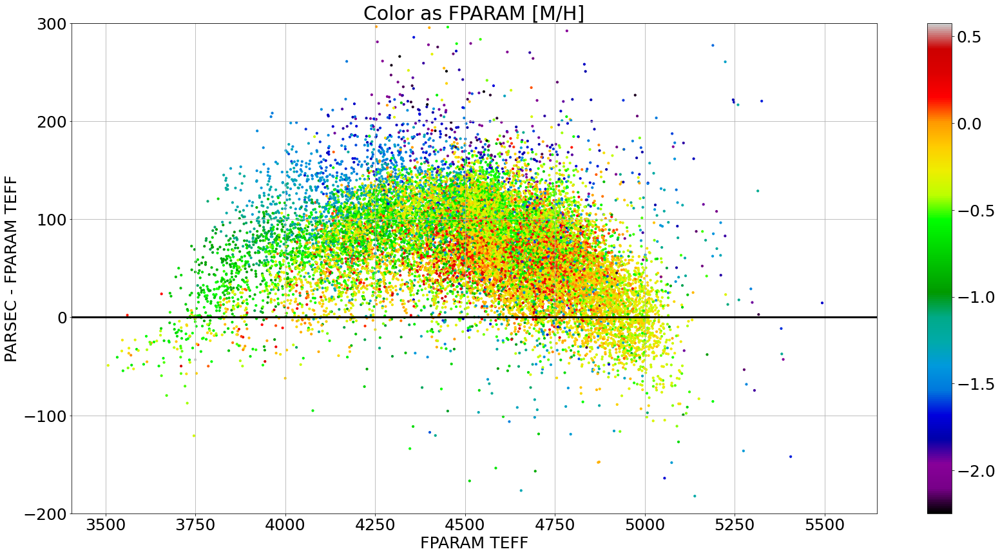

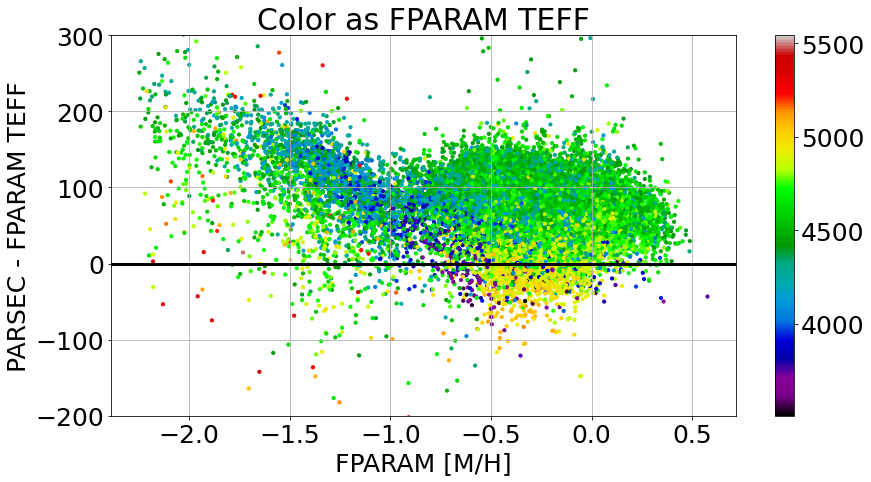

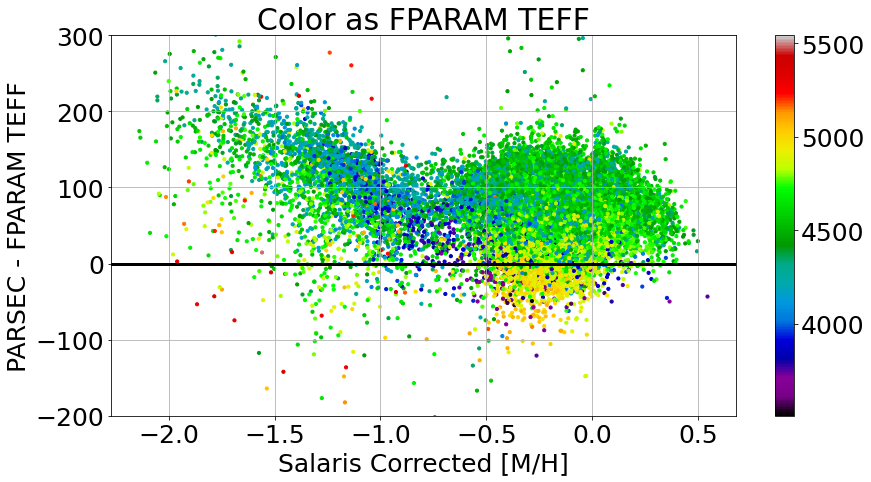

In [397]:
plt.figure(figsize=[28,14])
plt.scatter(low_ext_rgb['FPARAM'][:,0],photteffs-low_ext_rgb['FPARAM'][:,0],
            c=low_ext_rgb['FPARAM'][:,3],cmap='nipy_spectral',s=10)
plt.colorbar()
plt.axhline(0.0,c='k',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as FPARAM [M/H]')
plt.xlabel(r'FPARAM TEFF')
plt.ylabel(r'PARSEC - FPARAM TEFF');

plt.figure(figsize=[14,7])
# plt.scatter(salfeh[low_ak][resid_rc_cut],photteffs-low_ext_rgb['FPARAM'][:,0],
#             c=low_ext_rgb['FPARAM'][:,0],cmap='nipy_spectral',s=10)
plt.scatter(low_ext_rgb['FPARAM'][:,3],photteffs-low_ext_rgb['FPARAM'][:,0],
            c=low_ext_rgb['FPARAM'][:,0],cmap='nipy_spectral',s=10)
plt.colorbar()
plt.axhline(0.0,c='k',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as FPARAM TEFF')
plt.xlabel(r'FPARAM [M/H]')
plt.ylabel(r'PARSEC - FPARAM TEFF');

plt.figure(figsize=[14,7])
plt.scatter(low_ext_salfeh,photteffs-low_ext_rgb['FPARAM'][:,0],
            c=low_ext_rgb['FPARAM'][:,0],cmap='nipy_spectral',s=10)
# plt.scatter(low_ext_rgb['FPARAM'][:,3],photteffs-low_ext_rgb['FPARAM'][:,0],
#             c=low_ext_rgb['FPARAM'][:,0],cmap='nipy_spectral',s=10)
plt.colorbar()
plt.axhline(0.0,c='k',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as FPARAM TEFF')
plt.xlabel(r'Salaris Corrected [M/H]')
plt.ylabel(r'PARSEC - FPARAM TEFF');

Text(0, 0.5, 'Salaris Corrected [Fe/H]')

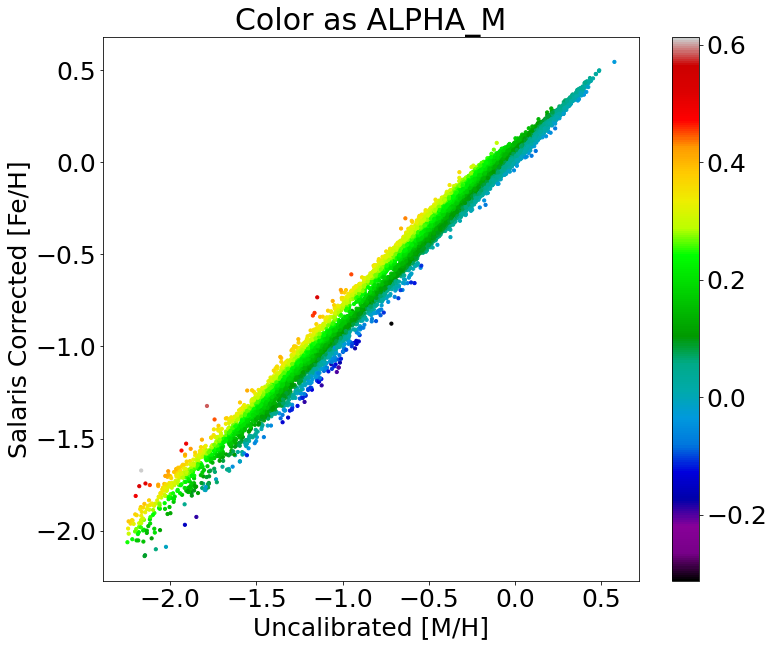

In [398]:
plt.figure(figsize=[12,10])
plt.scatter(low_ext_rgb['FPARAM'][:,3],low_ext_salfeh,c=low_ext_rgb['ALPHA_M'],
            cmap='nipy_spectral',s=10)
plt.colorbar()
plt.title(r'Color as ALPHA_M')
plt.xlabel(r'Uncalibrated [M/H]')
plt.ylabel(r'Salaris Corrected [Fe/H]')

Text(0, 0.5, '[$\\alpha$/Fe]')

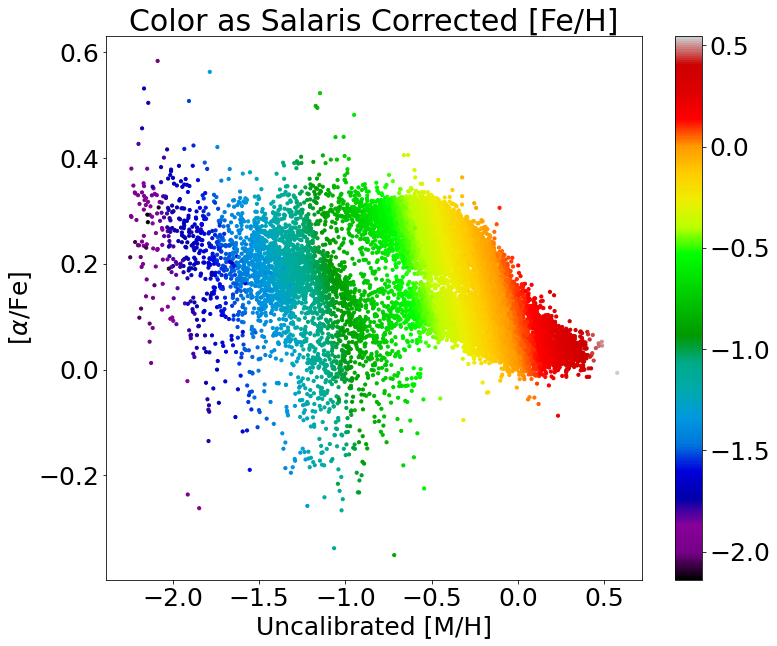

In [399]:
plt.figure(figsize=[12,10])
plt.scatter(low_ext_rgb['FPARAM'][:,3],low_ext_afe,c=low_ext_salfeh,
            cmap='nipy_spectral',s=10)
plt.colorbar()
plt.title(r'Color as Salaris Corrected [Fe/H]')
plt.xlabel(r'Uncalibrated [M/H]')
plt.ylabel(r'[$\alpha$/Fe]')

# Teff Spline

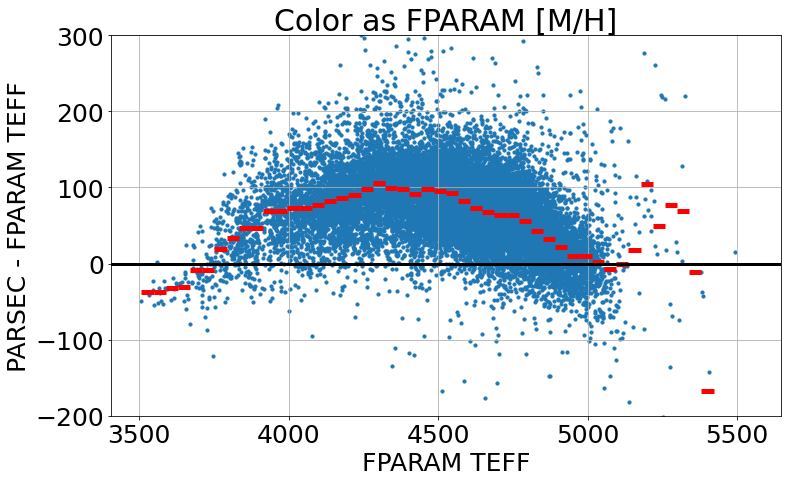

In [400]:
fincut = np.where((np.isfinite(low_ext_rgb['FPARAM'][:,0])==True)&
                  (np.isfinite(low_ext_rgb['FPARAM'][:,3])==True)&(np.isfinite(photteffs)==True))

meds,edgs,_ = binned_statistic(low_ext_rgb['FPARAM'][:,0][fincut],(photteffs-low_ext_rgb['FPARAM'][:,0])[fincut],
                               bins=50)

cens = edgs[:-1]+np.nanmedian(np.diff(edgs))/2.

plt.figure(figsize=[12,7])
plt.scatter(low_ext_rgb['FPARAM'][:,0],photteffs-low_ext_rgb['FPARAM'][:,0],s=10)
plt.hlines(meds,edgs[:-1],edgs[1:], colors='r', lw=5.)
plt.axhline(0.0,c='k',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as FPARAM [M/H]')
plt.xlabel(r'FPARAM TEFF')
plt.ylabel(r'PARSEC - FPARAM TEFF');

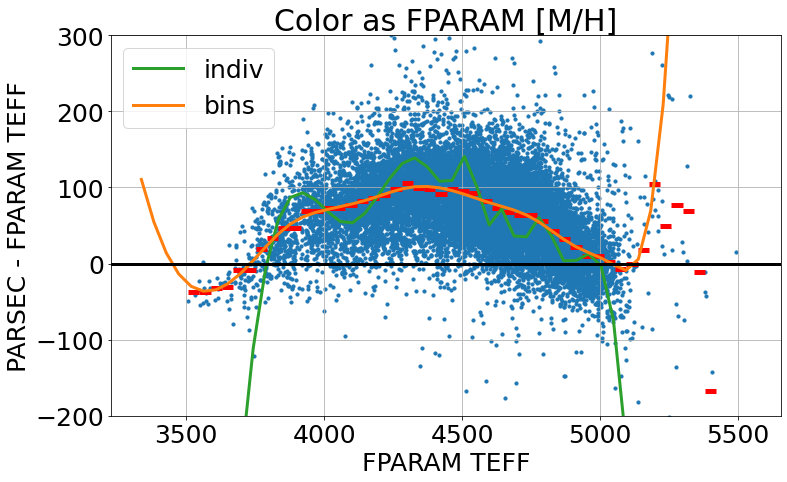

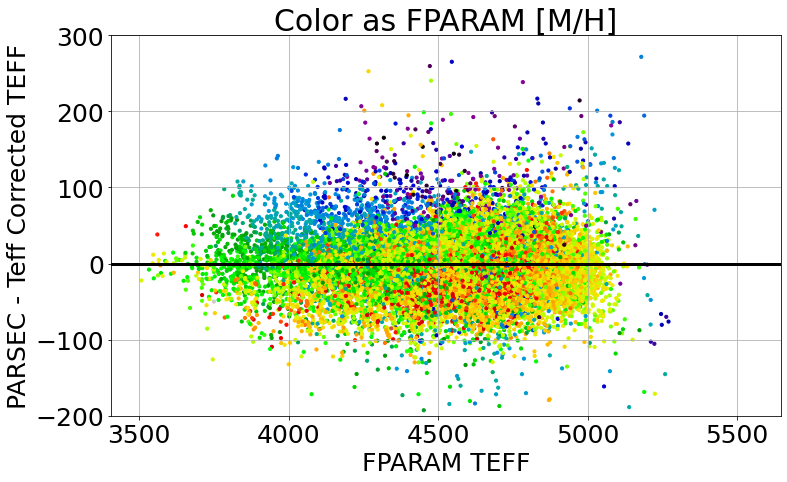

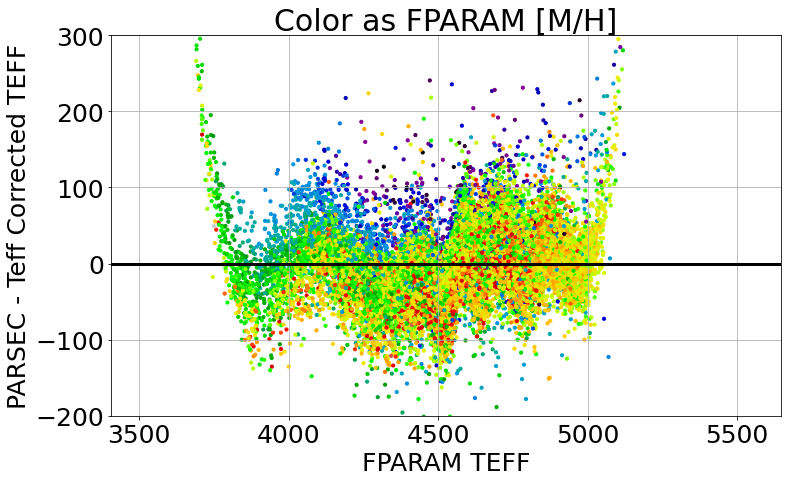

In [401]:
fincut = np.where((np.isfinite(low_ext_rgb['FPARAM'][:,0])==True)&
                  (np.isfinite(low_ext_rgb['FPARAM'][:,3])==True)&(np.isfinite(photteffs)==True))

meds,edgs,_ = binned_statistic(low_ext_rgb['FPARAM'][:,0][fincut],(photteffs-low_ext_rgb['FPARAM'][:,0])[fincut],
                               bins=50)

cens = edgs[:-1]+np.nanmedian(np.diff(edgs))/2.

fincut = np.where((np.isfinite(cens)==True)&(np.isfinite(meds)==True))

tright = -8
tleft = 1
cal_spl = utils.bspline(cens[fincut][tleft:tright],meds[fincut][tleft:tright],extrapolate=True)
tcal_spl = utils.bspline(low_ext_rgb['FPARAM'][:,0][fincut],(photteffs-low_ext_rgb['FPARAM'][:,0])[fincut],
                         extrapolate=True)

###
plt.figure(figsize=[12,7])
plt.scatter(low_ext_rgb['FPARAM'][:,0],photteffs-low_ext_rgb['FPARAM'][:,0],s=10)
plt.hlines(meds[fincut],edgs[:-1][fincut],edgs[1:][fincut], colors='r', lw=5.)
plt.plot(np.linspace(np.nanmin(low_ext_rgb['FPARAM'][:,0]),np.nanmax(low_ext_rgb['FPARAM'][:,0]))
         ,tcal_spl(np.linspace(np.nanmin(low_ext_rgb['FPARAM'][:,0]),np.nanmax(low_ext_rgb['FPARAM'][:,0]))),
         c='tab:green',lw=3.0,label='indiv')
plt.plot(np.linspace(np.nanmin(low_ext_rgb['FPARAM'][:,0]),np.nanmax(low_ext_rgb['FPARAM'][:,0])),
         cal_spl(np.linspace(np.nanmin(low_ext_rgb['FPARAM'][:,0]),np.nanmax(low_ext_rgb['FPARAM'][:,0]))),
         lw=3.0,c='tab:orange',label='bins')

plt.legend()

# plt.plot(cens[fincut][tleft:tright],tcal_spl(cens[fincut][tleft:tright]),c='tab:green',lw=3.0)
plt.axhline(0.0,c='k',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as FPARAM [M/H]')
plt.xlabel(r'FPARAM TEFF')
plt.ylabel(r'PARSEC - FPARAM TEFF');

###
plt.figure(figsize=[12,7])
plt.scatter(low_ext_rgb['FPARAM'][:,0],
            photteffs-(cal_spl(low_ext_rgb['FPARAM'][:,0])+low_ext_rgb['FPARAM'][:,0]),
            c=low_ext_rgb['FPARAM'][:,3],s=10,cmap='nipy_spectral')
plt.axhline(0.0,c='k',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as FPARAM [M/H]')
plt.xlabel(r'FPARAM TEFF')
plt.ylabel(r'PARSEC - Teff Corrected TEFF');

###
plt.figure(figsize=[12,7])
plt.scatter(low_ext_rgb['FPARAM'][:,0],
            photteffs-(tcal_spl(low_ext_rgb['FPARAM'][:,0])+low_ext_rgb['FPARAM'][:,0]),
            c=low_ext_rgb['FPARAM'][:,3],s=10,cmap='nipy_spectral')
plt.axhline(0.0,c='k',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as FPARAM [M/H]')
plt.xlabel(r'FPARAM TEFF')
plt.ylabel(r'PARSEC - Teff Corrected TEFF');

In [403]:
cal_spl.tck

(array([3568.20092773, 3568.20092773, 3568.20092773, 3568.20092773,
        3716.32464045, 3864.44835316, 4012.57182173, 4160.6953125 ,
        4308.81915838, 4456.94256037, 4605.06640625, 4753.19034091,
        4901.31347656, 5049.43714489, 5197.56054688, 5197.56054688,
        5197.56054688, 5197.56054688]),
 array([-36.44472377, -37.62832701, -11.04530788,  57.69144591,
         71.80297475,  82.18803033, 104.78540001,  99.30138125,
         77.58396903,  66.29211563,  18.59654776,   5.31322307,
        -30.35224378, 103.27554311,   0.        ,   0.        ,
          0.        ,   0.        ]),
 3)

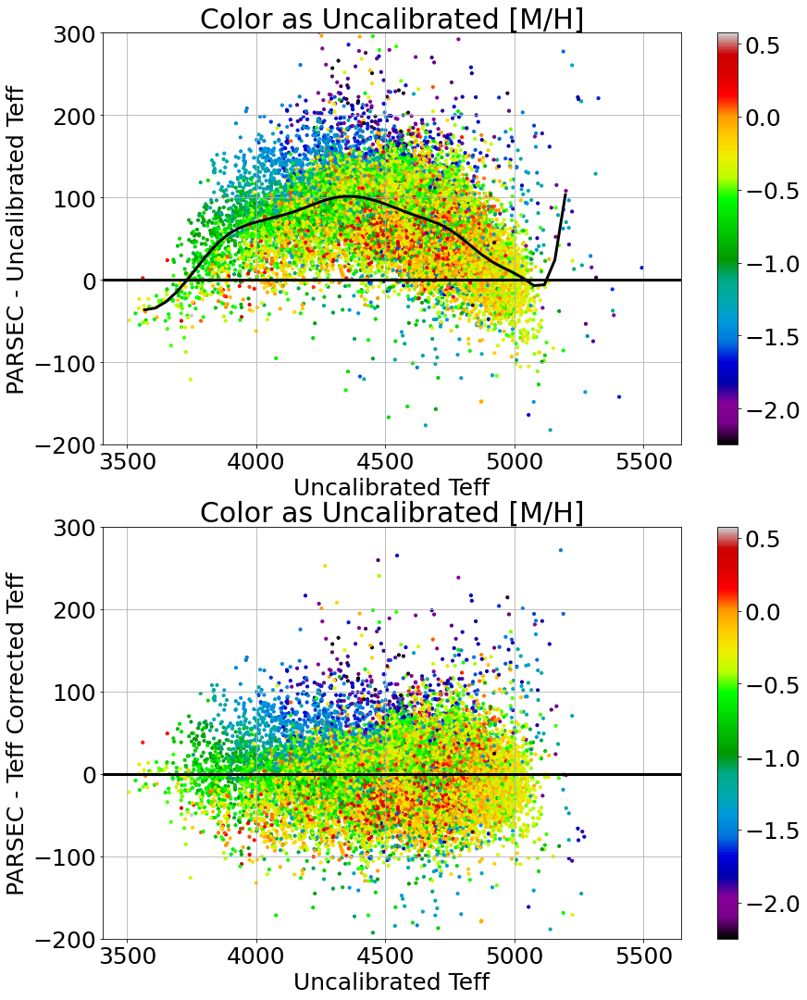

In [404]:
###
plt.figure(figsize=[14,18])
plt.subplot(211)
plt.scatter(low_ext_rgb['FPARAM'][:,0],photteffs-low_ext_rgb['FPARAM'][:,0],c=low_ext_rgb['FPARAM'][:,3],s=10,
            cmap='nipy_spectral')
# plt.hlines(meds[fincut],edgs[:-1][fincut],edgs[1:][fincut], colors='r', lw=5.)
plt.colorbar()
plt.plot(cens[fincut][tleft:tright],cal_spl(cens[fincut][tleft:tright]),c='k',lw=3.0)
plt.axhline(0.0,c='k',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as Uncalibrated [M/H]')
plt.xlabel(r'Uncalibrated Teff')
plt.ylabel(r'PARSEC - Uncalibrated Teff')

###
plt.subplot(212)
plt.scatter(low_ext_rgb['FPARAM'][:,0],
            photteffs-(cal_spl(low_ext_rgb['FPARAM'][:,0])+low_ext_rgb['FPARAM'][:,0]),
            c=low_ext_rgb['FPARAM'][:,3],s=10,cmap='nipy_spectral')
plt.colorbar()
plt.axhline(0.0,c='k',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as Uncalibrated [M/H]')
plt.xlabel(r'Uncalibrated Teff')
plt.ylabel(r'PARSEC - Teff Corrected Teff')

# plt.savefig('../plots/teff_correction_spline.pdf',dpi=300,bbox_inches='tight')
plt.show()

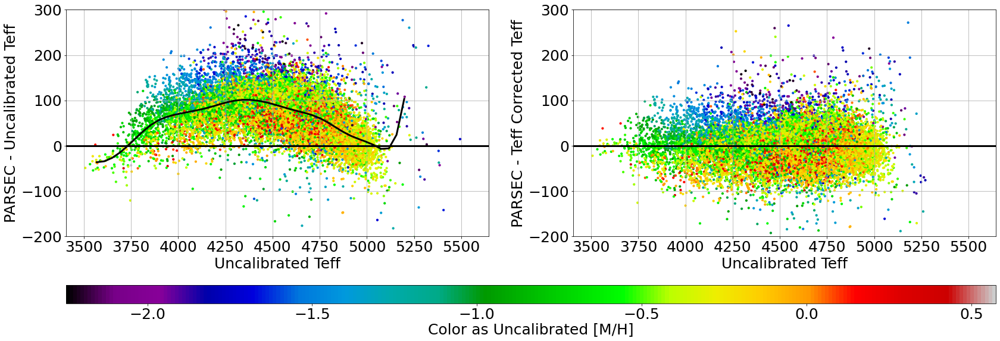

In [405]:
###
fig,ax = plt.subplots(1,2,figsize=[28,10])

ax[0].scatter(low_ext_rgb['FPARAM'][:,0],photteffs-low_ext_rgb['FPARAM'][:,0],c=low_ext_rgb['FPARAM'][:,3],s=10,
            cmap='nipy_spectral')

ax[0].plot(cens[fincut][tleft:tright],cal_spl(cens[fincut][tleft:tright]),c='k',lw=3.0)
ax[0].axhline(0.0,c='k',lw=3.0)
ax[0].set_ylim(-200,300)
ax[0].grid()
ax[0].set_xlabel(r'Uncalibrated Teff')
ax[0].set_ylabel(r'PARSEC - Uncalibrated Teff')

###
im = ax[1].scatter(low_ext_rgb['FPARAM'][:,0],
            photteffs-(cal_spl(low_ext_rgb['FPARAM'][:,0])+low_ext_rgb['FPARAM'][:,0]),
            c=low_ext_rgb['FPARAM'][:,3],s=10,cmap='nipy_spectral')

ax[1].axhline(0.0,c='k',lw=3.0)
ax[1].set_ylim(-200,300)
ax[1].grid()
ax[1].set_xlabel(r'Uncalibrated Teff')
ax[1].set_ylabel(r'PARSEC - Teff Corrected Teff')

cbar = fig.colorbar(im,orientation='horizontal',aspect=50,ax=ax.ravel().tolist())
cbar.set_label('Color as Uncalibrated [M/H]',labelpad=1)

plt.savefig('../plots/teff_correction_spline.pdf',dpi=300,bbox_inches='tight')
plt.show()

# [M/H] Spline

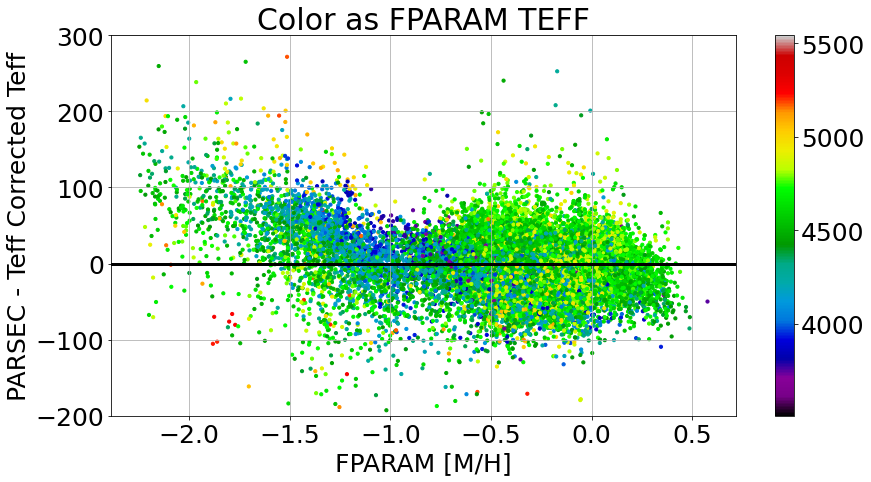

In [406]:
plt.figure(figsize=[14,7])
plt.scatter(low_ext_rgb['FPARAM'][:,3],
            photteffs-(cal_spl(low_ext_rgb['FPARAM'][:,0])+low_ext_rgb['FPARAM'][:,0]),
            c=low_ext_rgb['FPARAM'][:,0],s=10,cmap='nipy_spectral')
plt.colorbar()
plt.axhline(0.0,c='k',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as FPARAM TEFF')
plt.xlabel(r'FPARAM [M/H]')
plt.ylabel(r'PARSEC - Teff Corrected Teff');

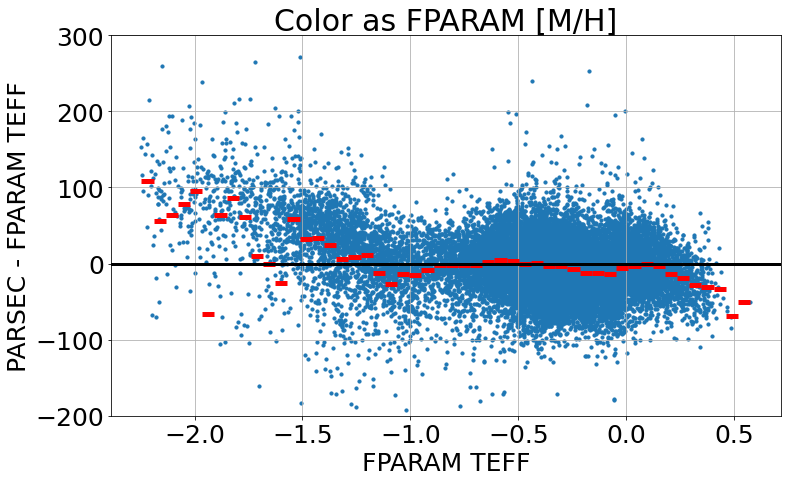

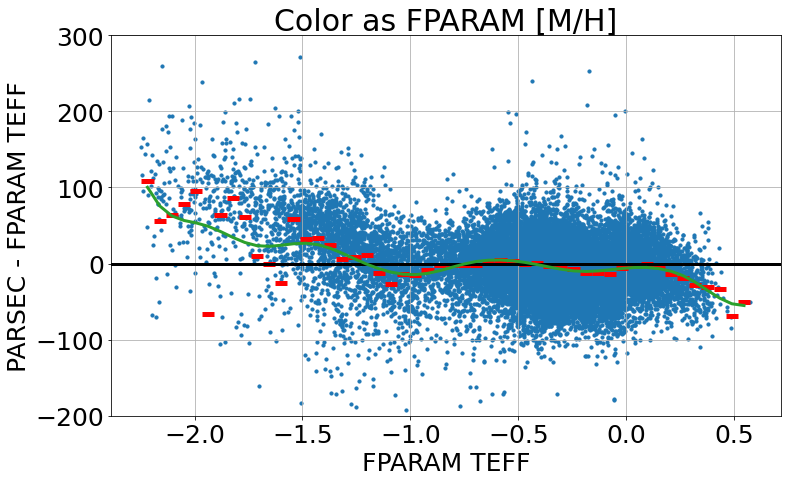

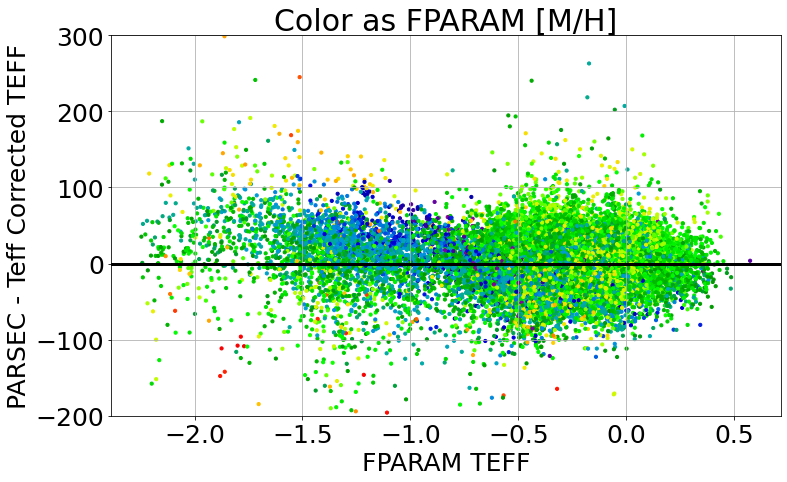

In [407]:
fincut = np.where((np.isfinite(cal_spl(low_ext_rgb['FPARAM'][:,0])+low_ext_rgb['FPARAM'][:,0])==True)&
                  (np.isfinite(low_ext_rgb['FPARAM'][:,3])==True)&(np.isfinite(photteffs)==True))

fmeds,fedgs,_ = binned_statistic(low_ext_rgb['FPARAM'][:,3][fincut],
                               (photteffs-(cal_spl(low_ext_rgb['FPARAM'][:,0])+low_ext_rgb['FPARAM'][:,0]))[fincut],
                               bins=50)

fcens = fedgs[:-1]+np.nanmedian(np.diff(fedgs))/2.

plt.figure(figsize=[12,7])
plt.scatter(low_ext_rgb['FPARAM'][:,3],
            photteffs-(cal_spl(low_ext_rgb['FPARAM'][:,0])+low_ext_rgb['FPARAM'][:,0]),
            s=10)
plt.hlines(fmeds,fedgs[:-1],fedgs[1:], colors='r', lw=5.)
plt.axhline(0.0,c='k',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as FPARAM [M/H]')
plt.xlabel(r'FPARAM TEFF')
plt.ylabel(r'PARSEC - FPARAM TEFF');

fincut = np.where((np.isfinite(fcens)==True)&(np.isfinite(fmeds)==True))
fcal_spl  = utils.bspline(fcens[fincut],fmeds[fincut],extrapolate=True)

###
plt.figure(figsize=[12,7])
plt.scatter(low_ext_rgb['FPARAM'][:,3],
            photteffs-(cal_spl(low_ext_rgb['FPARAM'][:,0])+low_ext_rgb['FPARAM'][:,0]),
            s=10)
plt.hlines(fmeds,fedgs[:-1],fedgs[1:], colors='r', lw=5.)
plt.axhline(0.0,c='k',lw=3.0)
plt.plot(fcens[fincut],fcal_spl(fcens[fincut]),c='tab:green',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as FPARAM [M/H]')
plt.xlabel(r'FPARAM TEFF')
plt.ylabel(r'PARSEC - FPARAM TEFF');

###
plt.figure(figsize=[12,7])
plt.scatter(low_ext_rgb['FPARAM'][:,3],
            photteffs-(fcal_spl(low_ext_rgb['FPARAM'][:,3])+
                       (cal_spl(low_ext_rgb['FPARAM'][:,0])+low_ext_rgb['FPARAM'][:,0])),
            c=low_ext_rgb['FPARAM'][:,0],s=10,cmap='nipy_spectral')
plt.axhline(0.0,c='k',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as FPARAM [M/H]')
plt.xlabel(r'FPARAM TEFF')
plt.ylabel(r'PARSEC - Teff Corrected TEFF');

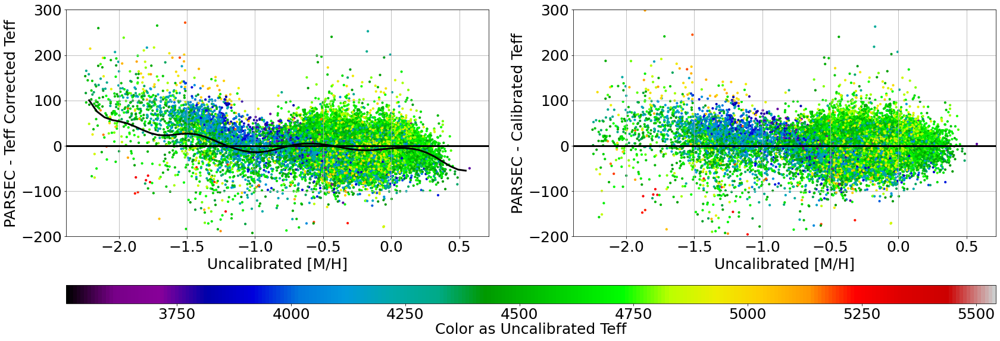

In [408]:
###
fig,ax = plt.subplots(1,2,figsize=[28,10])
ax[0].scatter(low_ext_rgb['FPARAM'][:,3],
              photteffs-(cal_spl(low_ext_rgb['FPARAM'][:,0])+low_ext_rgb['FPARAM'][:,0]),s=10,
              c=low_ext_rgb['FPARAM'][:,0],cmap='nipy_spectral')
# plt.hlines(fmeds,fedgs[:-1],fedgs[1:], colors='r', lw=5.)
ax[0].axhline(0.0,c='k',lw=3.0)
ax[0].plot(fcens[fincut],fcal_spl(fcens[fincut]),c='k',lw=3.0)
ax[0].set_ylim(-200,300)
ax[0].grid()
# plt.title(r'Color as FPARAM [M/H]')
ax[0].set_xlabel(r'Uncalibrated [M/H]')
ax[0].set_ylabel(r'PARSEC - Teff Corrected Teff');

###
# plt.figure(figsize=[12,7])
im = ax[1].scatter(low_ext_rgb['FPARAM'][:,3],
            photteffs-(fcal_spl(low_ext_rgb['FPARAM'][:,3])+
                       (cal_spl(low_ext_rgb['FPARAM'][:,0])+low_ext_rgb['FPARAM'][:,0])),
            c=low_ext_rgb['FPARAM'][:,0],s=10,cmap='nipy_spectral')
ax[1].axhline(0.0,c='k',lw=3.0)
ax[1].set_ylim(-200,300)
ax[1].grid()
# plt.title(r'Color as FPARAM [M/H]')
ax[1].set_xlabel(r'Uncalibrated [M/H]')
ax[1].set_ylabel(r'PARSEC - Calibrated Teff')

cbar = fig.colorbar(im,orientation='horizontal',aspect=50,ax=ax.ravel().tolist())
cbar.set_label('Color as Uncalibrated Teff',labelpad=1)

plt.savefig('../plots/mh_correction_spline.pdf',dpi=300,bbox_inches='tight')
plt.show()

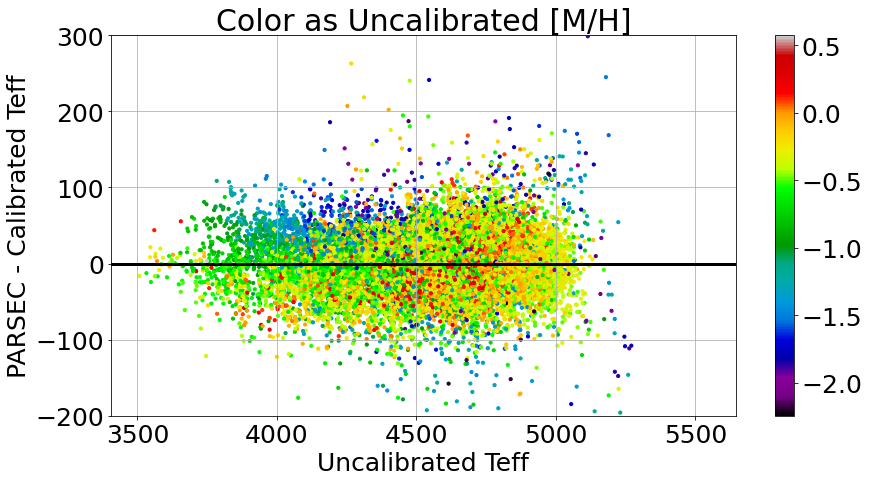

In [409]:
plt.figure(figsize=[14,7])
im = plt.scatter(low_ext_rgb['FPARAM'][:,0],
            photteffs-(fcal_spl(low_ext_rgb['FPARAM'][:,3])+
                       (cal_spl(low_ext_rgb['FPARAM'][:,0])+low_ext_rgb['FPARAM'][:,0])),
            c=low_ext_rgb['FPARAM'][:,3],s=10,cmap='nipy_spectral')
plt.colorbar()
plt.axhline(0.0,c='k',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as Uncalibrated [M/H]')
plt.xlabel(r'Uncalibrated Teff')
plt.ylabel(r'PARSEC - Calibrated Teff')
plt.show()

In [410]:
# np.round(np.array([fcal_spl.tck[0],fcal_spl.tck[1]]).T,3)

3.1766323302779256
24.17567978575198


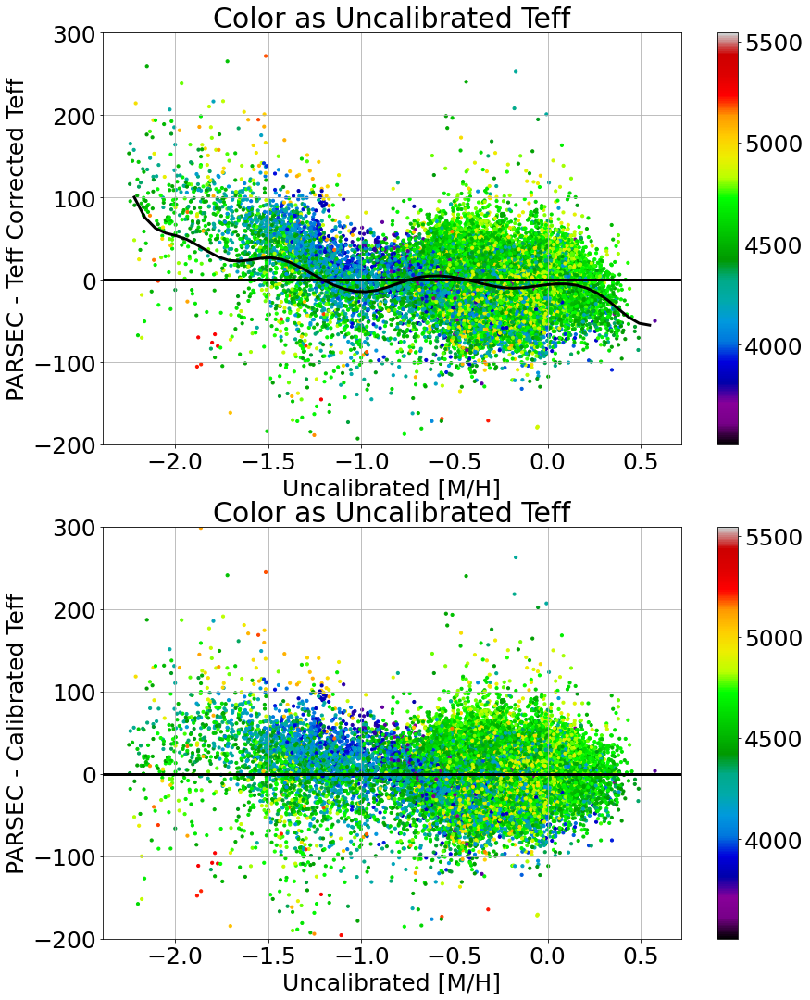

In [411]:
###
plt.figure(figsize=[14,18])
plt.subplot(211)
plt.scatter(low_ext_rgb['FPARAM'][:,3],
            photteffs-(cal_spl(low_ext_rgb['FPARAM'][:,0])+low_ext_rgb['FPARAM'][:,0]),
            c=low_ext_rgb['FPARAM'][:,0],s=10,cmap='nipy_spectral')
# plt.hlines(fmeds,fedgs[:-1],fedgs[1:], colors='r', lw=5.)
plt.axhline(0.0,c='k',lw=3.0)
plt.plot(fcens[fincut],fcal_spl(fcens[fincut]),c='k',lw=3.0)
plt.colorbar()
# plt.plot(cens[fincut][tleft:tright],cal_spl(cens[fincut][tleft:tright]),c='k',lw=3.0)
plt.axhline(0.0,c='k',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as Uncalibrated Teff')
plt.xlabel(r'Uncalibrated [M/H]')
plt.ylabel(r'PARSEC - Teff Corrected Teff')

###
print(np.nanmedian(photteffs-(fcal_spl(low_ext_rgb['FPARAM'][:,3])+
                       (cal_spl(low_ext_rgb['FPARAM'][:,0])+low_ext_rgb['FPARAM'][:,0]))))
print(mad( photteffs-(fcal_spl(low_ext_rgb['FPARAM'][:,3])+
                       (cal_spl(low_ext_rgb['FPARAM'][:,0])+low_ext_rgb['FPARAM'][:,0]))))

plt.subplot(212)
plt.scatter(low_ext_rgb['FPARAM'][:,3],
            photteffs-(fcal_spl(low_ext_rgb['FPARAM'][:,3])+
                       (cal_spl(low_ext_rgb['FPARAM'][:,0])+low_ext_rgb['FPARAM'][:,0])),
            c=low_ext_rgb['FPARAM'][:,0],s=10,cmap='nipy_spectral')
plt.colorbar()
plt.axhline(0.0,c='k',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as Uncalibrated Teff')
plt.xlabel(r'Uncalibrated [M/H]')
plt.ylabel(r'PARSEC - Calibrated Teff')

# plt.savefig('../plots/mh_correction_spline.pdf',dpi=300,bbox_inches='tight')
plt.show()

Text(0, 0.5, 'PARSEC - Teff Corrected Teff')

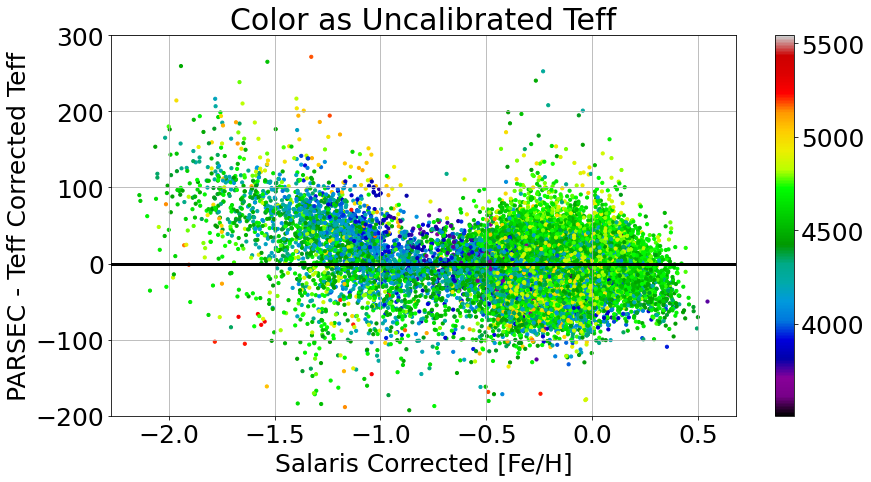

In [412]:
plt.figure(figsize=[14,7])
plt.scatter(low_ext_salfeh,
            photteffs-(cal_spl(low_ext_rgb['FPARAM'][:,0])+low_ext_rgb['FPARAM'][:,0]),
            c=low_ext_rgb['FPARAM'][:,0],s=10,cmap='nipy_spectral')
# plt.hlines(fmeds,fedgs[:-1],fedgs[1:], colors='r', lw=5.)
plt.axhline(0.0,c='k',lw=3.0)
# plt.plot(fcens[fincut],fcal_spl(fcens[fincut]),c='k',lw=3.0)
plt.colorbar()
# plt.plot(cens[fincut][tleft:tright],cal_spl(cens[fincut][tleft:tright]),c='k',lw=3.0)
plt.axhline(0.0,c='k',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as Uncalibrated Teff')
plt.xlabel(r'Salaris Corrected [Fe/H]')
plt.ylabel(r'PARSEC - Teff Corrected Teff')

Text(0, 0.5, 'PARSEC - Calibrated Teff')

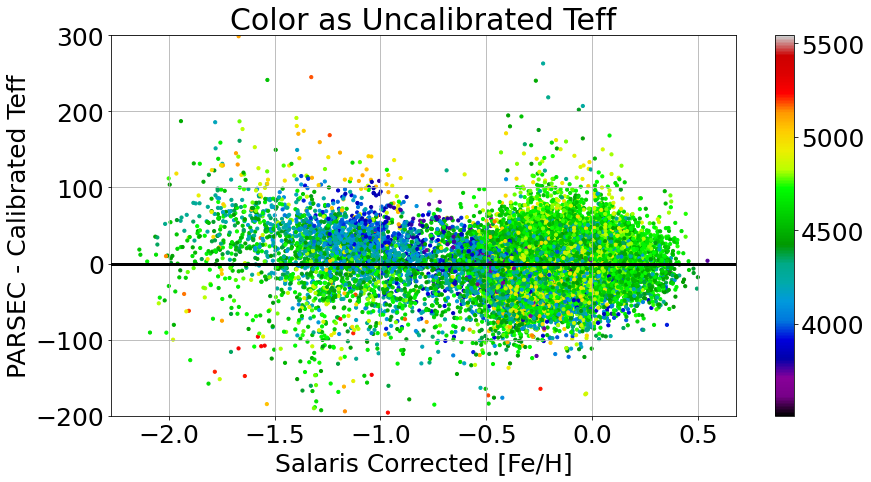

In [413]:
plt.figure(figsize=[14,7])
plt.scatter(low_ext_salfeh,
            photteffs-(fcal_spl(low_ext_rgb['FPARAM'][:,3])+
                       (cal_spl(low_ext_rgb['FPARAM'][:,0])+low_ext_rgb['FPARAM'][:,0])),
            c=low_ext_rgb['FPARAM'][:,0],s=10,cmap='nipy_spectral')
plt.colorbar()
plt.axhline(0.0,c='k',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as Uncalibrated Teff')
plt.xlabel(r'Salaris Corrected [Fe/H]')
plt.ylabel(r'PARSEC - Calibrated Teff')

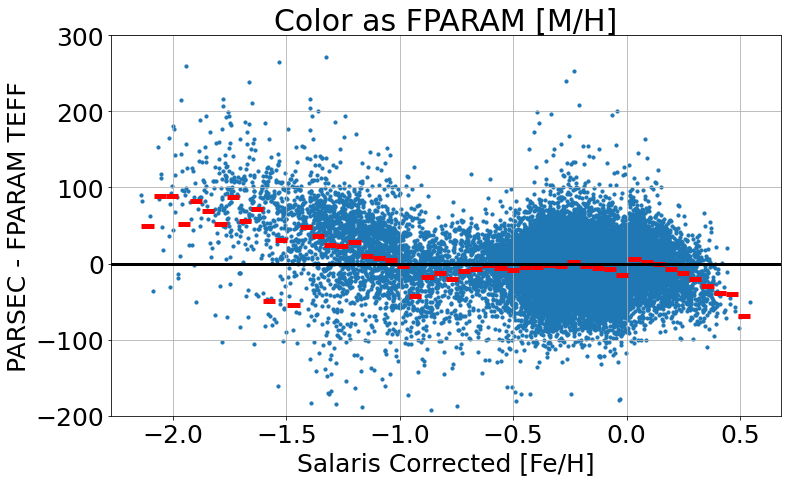

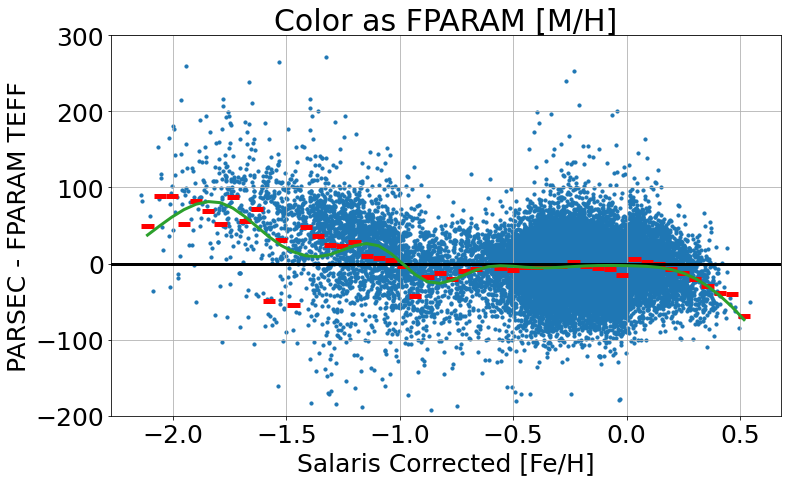

3.1231621236847786
24.608597592302658


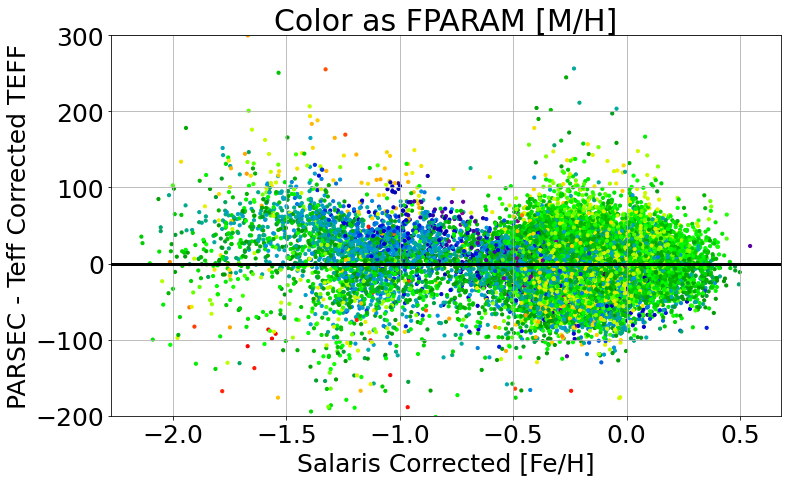

Text(0, 0.5, 'PARSEC - Calibrated Teff')

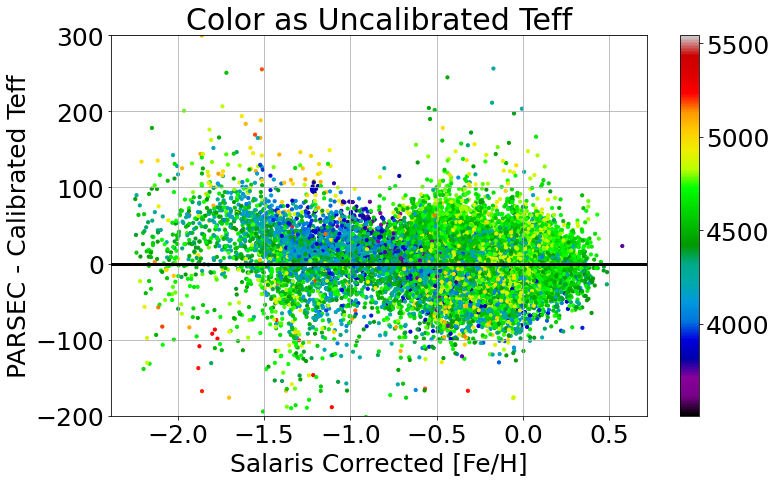

In [414]:
fincut = np.where((np.isfinite(cal_spl(low_ext_rgb['FPARAM'][:,0])+low_ext_rgb['FPARAM'][:,0])==True)&
                  (np.isfinite(low_ext_salfeh)==True)&(np.isfinite(photteffs)==True))

salmeds,saledgs,_ = binned_statistic(low_ext_salfeh[fincut],
                               (photteffs-(cal_spl(low_ext_rgb['FPARAM'][:,0])+low_ext_rgb['FPARAM'][:,0]))[fincut],
                               bins=50)

salcens = saledgs[:-1]+np.nanmedian(np.diff(saledgs))/2.

plt.figure(figsize=[12,7])
plt.scatter(low_ext_salfeh,
            photteffs-(cal_spl(low_ext_rgb['FPARAM'][:,0])+low_ext_rgb['FPARAM'][:,0]),
            s=10)
plt.hlines(salmeds,saledgs[:-1],saledgs[1:], colors='r', lw=5.)
plt.axhline(0.0,c='k',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as FPARAM [M/H]')
plt.xlabel(r'Salaris Corrected [Fe/H]')
plt.ylabel(r'PARSEC - FPARAM TEFF')
plt.show()

fincut = np.where((np.isfinite(salcens)==True)&(np.isfinite(salmeds)==True))
salcal_spl  = utils.bspline(salcens[fincut],salmeds[fincut],extrapolate=True)

###
plt.figure(figsize=[12,7])
plt.scatter(low_ext_salfeh,
            photteffs-(cal_spl(low_ext_rgb['FPARAM'][:,0])+low_ext_rgb['FPARAM'][:,0]),
            s=10)
plt.hlines(salmeds,saledgs[:-1],saledgs[1:], colors='r', lw=5.)
plt.axhline(0.0,c='k',lw=3.0)
plt.plot(salcens[fincut],salcal_spl(fcens[fincut]),c='tab:green',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as FPARAM [M/H]')
plt.xlabel(r'Salaris Corrected [Fe/H]')
plt.ylabel(r'PARSEC - FPARAM TEFF')
plt.show()

###
plt.figure(figsize=[12,7])
plt.scatter(low_ext_salfeh,
            photteffs-(salcal_spl(low_ext_salfeh)+
                       (cal_spl(low_ext_rgb['FPARAM'][:,0])+low_ext_rgb['FPARAM'][:,0])),
            c=low_ext_rgb['FPARAM'][:,0],s=10,cmap='nipy_spectral')
plt.axhline(0.0,c='k',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as FPARAM [M/H]')
plt.xlabel(r'Salaris Corrected [Fe/H]')
plt.ylabel(r'PARSEC - Teff Corrected TEFF')
print(np.nanmedian(photteffs-(salcal_spl(low_ext_salfeh)+
                       (cal_spl(low_ext_rgb['FPARAM'][:,0])+low_ext_rgb['FPARAM'][:,0]))))
print(mad(photteffs-(salcal_spl(low_ext_salfeh)+
                       (cal_spl(low_ext_rgb['FPARAM'][:,0])+low_ext_rgb['FPARAM'][:,0]))))
plt.show()

###
plt.figure(figsize=[12,7])
plt.scatter(low_ext_rgb['FPARAM'][:,3],
            photteffs-(salcal_spl(low_ext_salfeh)+
                       (cal_spl(low_ext_rgb['FPARAM'][:,0])+low_ext_rgb['FPARAM'][:,0])),
            c=low_ext_rgb['FPARAM'][:,0],s=10,cmap='nipy_spectral')
plt.colorbar()
plt.axhline(0.0,c='k',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as Uncalibrated Teff')
plt.xlabel(r'Salaris Corrected [Fe/H]')
plt.ylabel(r'PARSEC - Calibrated Teff')

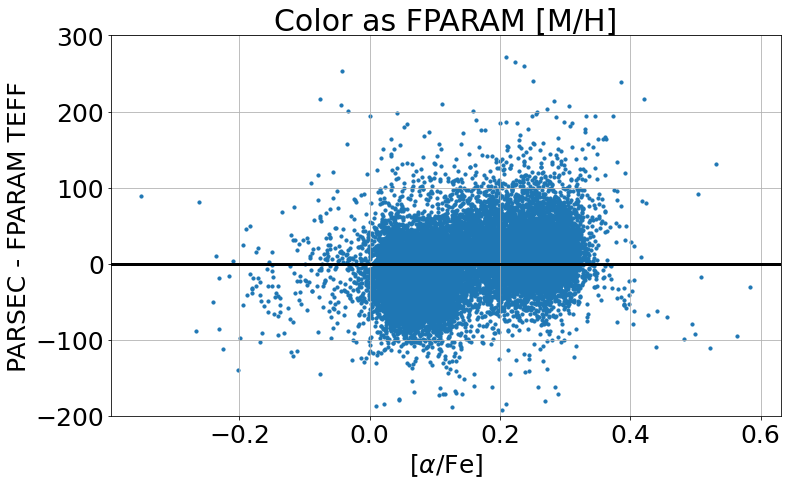

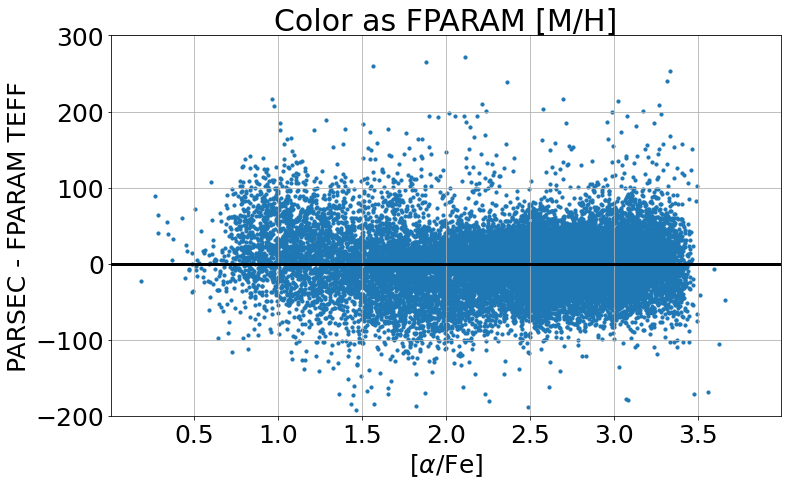

In [415]:
plt.figure(figsize=[12,7])
plt.scatter(low_ext_afe,
            photteffs-(cal_spl(low_ext_rgb['FPARAM'][:,0])+low_ext_rgb['FPARAM'][:,0]),
            s=10)
plt.axhline(0.0,c='k',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as FPARAM [M/H]')
plt.xlabel(r'[$\alpha$/Fe]')
plt.ylabel(r'PARSEC - FPARAM TEFF')
plt.show()

plt.figure(figsize=[12,7])
plt.scatter(low_ext_rgb['LOGG'],
            photteffs-(cal_spl(low_ext_rgb['FPARAM'][:,0])+low_ext_rgb['FPARAM'][:,0]),
            s=10)
plt.axhline(0.0,c='k',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as FPARAM [M/H]')
plt.xlabel(r'[$\alpha$/Fe]')
plt.ylabel(r'PARSEC - FPARAM TEFF')
plt.show()

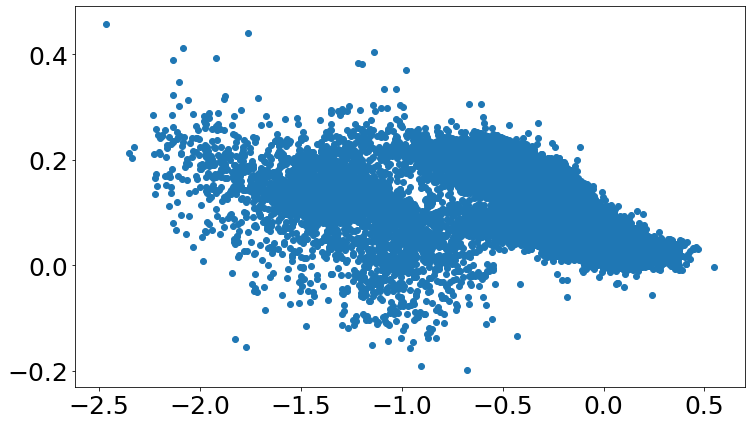

In [416]:
plt.figure(figsize=[12,7])
plt.scatter(low_ext_rgb['FE_H'],low_ext_salfeh-low_ext_rgb['FE_H'])


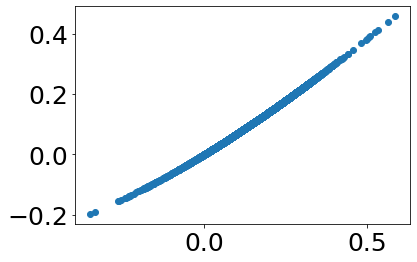

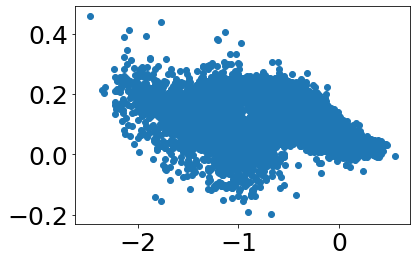

In [417]:
plt.scatter(low_ext_afe,np.log10(0.659*(10**(low_ext_afe))+0.341))
plt.show()

plt.scatter(low_ext_rgb['FE_H'],np.log10(0.659*(10**(low_ext_afe))+0.341))
plt.show()

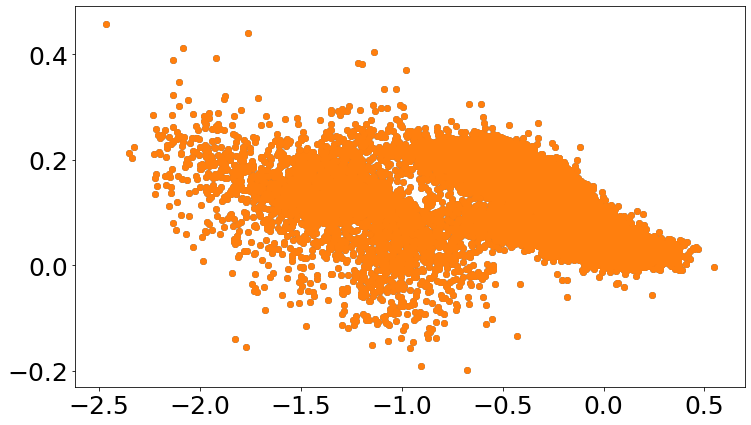

In [418]:
plt.figure(figsize=[12,7])
plt.scatter(low_ext_rgb['FE_H'],low_ext_salfeh-low_ext_rgb['FE_H'])
plt.scatter(low_ext_rgb['FE_H'],low_ext_rgb['FE_H']+np.log10(0.659*(10**(low_ext_afe))+0.341)-low_ext_rgb['FE_H'])



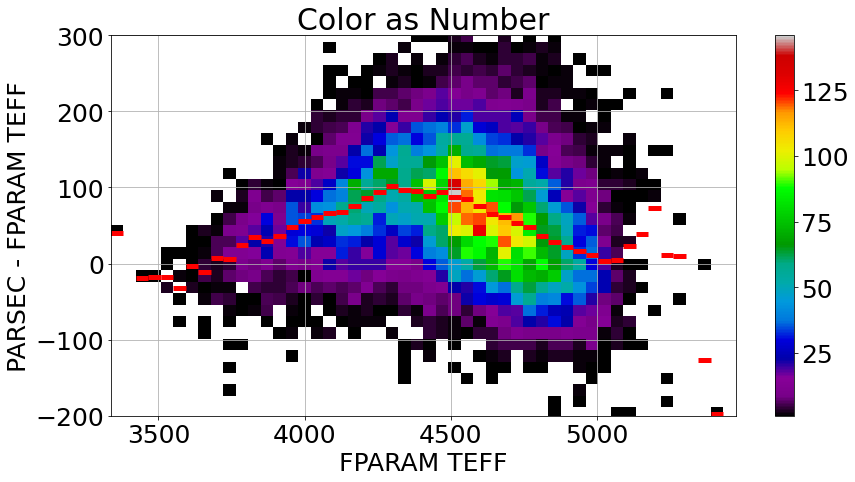

In [171]:
ret = binned_statistic_2d(low_ext_rgb['FPARAM'][:,0][fincut],(photteffs-low_ext_rgb['FPARAM'][:,0])[fincut],
                          low_ext_rgb['FPARAM'][:,0][fincut],'count',bins=50)
ret.statistic[ret.statistic == 0.0] = np.nan

plt.figure(figsize=[14,7])
im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral')
plt.colorbar()
plt.hlines(meds,edgs[:-1],edgs[1:], colors='r', lw=5.)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as Number')
plt.xlabel(r'FPARAM TEFF')
plt.ylabel(r'PARSEC - FPARAM TEFF');

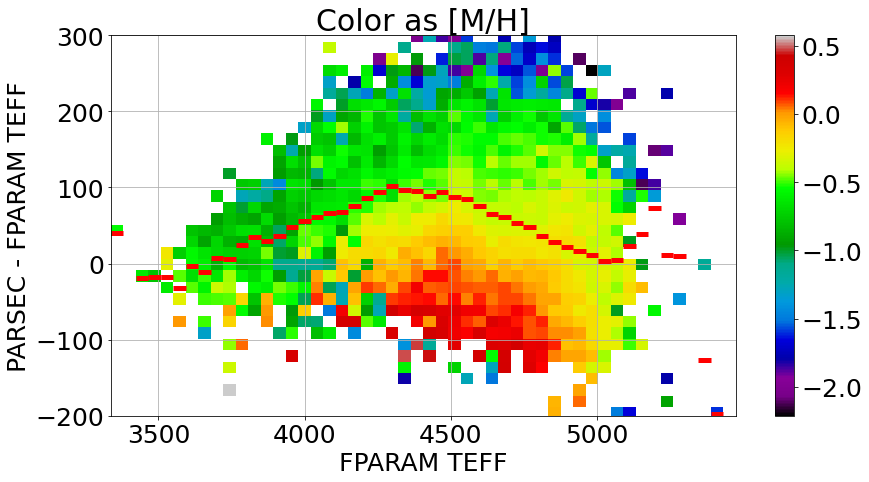

In [172]:
ret3 = binned_statistic_2d(low_ext_rgb['FPARAM'][:,0][fincut],(photteffs-low_ext_rgb['FPARAM'][:,0])[fincut],
                          low_ext_rgb['FPARAM'][:,3][fincut],'median',bins=50)
ret3.statistic[ret3.statistic == 0.0] = np.nan

plt.figure(figsize=[14,7])
im = plt.imshow(ret3.statistic.T, origin='lower',
                    extent=[ret3.x_edge[0],ret3.x_edge[-1],ret3.y_edge[0],ret3.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral')
plt.colorbar()
plt.hlines(meds,edgs[:-1],edgs[1:], colors='r', lw=5.)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as [M/H]')
plt.xlabel(r'FPARAM TEFF')
plt.ylabel(r'PARSEC - FPARAM TEFF');

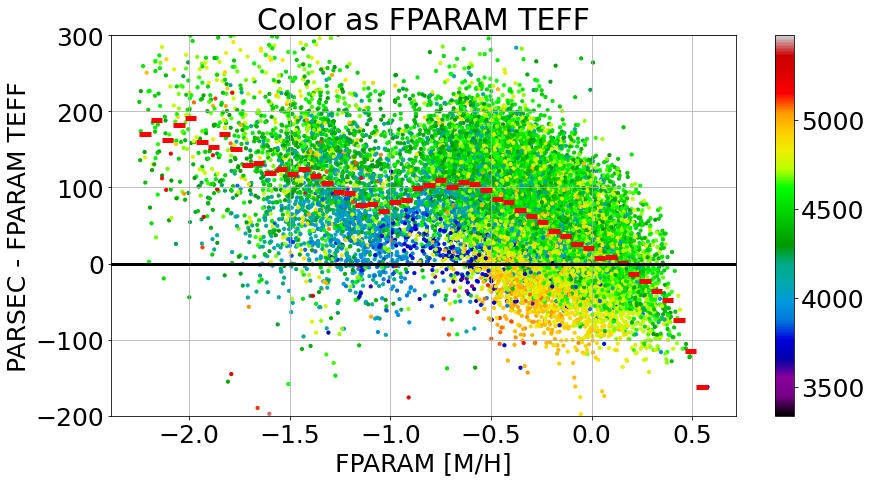

In [173]:
meds2,edgs2,_ = binned_statistic(low_ext_rgb['FPARAM'][:,3][fincut],
                                 (photteffs-low_ext_rgb['FPARAM'][:,0])[fincut],bins=50)

plt.figure(figsize=[14,7])
plt.scatter(low_ext_rgb['FPARAM'][:,3],photteffs-low_ext_rgb['FPARAM'][:,0],
            c=low_ext_rgb['FPARAM'][:,0],cmap='nipy_spectral',s=10)

plt.hlines(meds2,edgs2[:-1],edgs2[1:], colors='r', lw=5.)
plt.colorbar()
plt.axhline(0.0,c='k',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as FPARAM TEFF')
plt.xlabel(r'FPARAM [M/H]')
plt.ylabel(r'PARSEC - FPARAM TEFF');

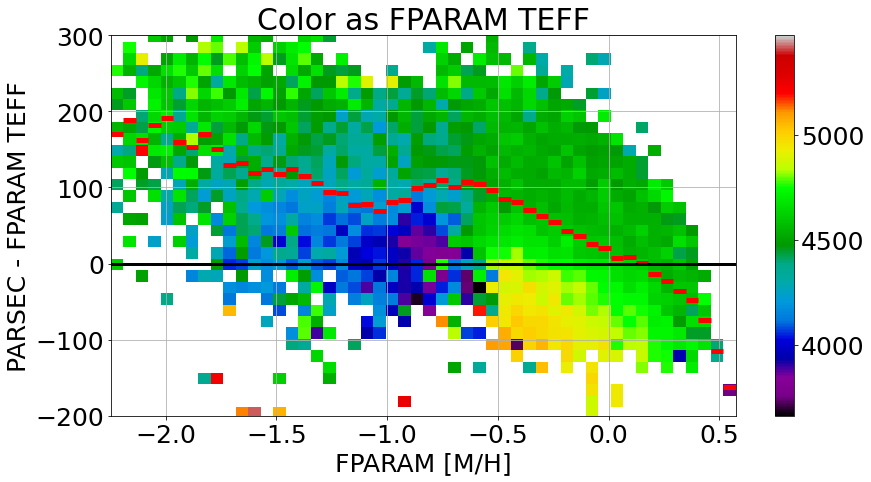

In [174]:
ret2 = binned_statistic_2d(low_ext_rgb['FPARAM'][:,3][fincut],(photteffs-low_ext_rgb['FPARAM'][:,0])[fincut],
                          low_ext_rgb['FPARAM'][:,0][fincut],'median',bins=50)
ret2.statistic[ret.statistic == 0.0] = np.nan

plt.figure(figsize=[14,7])
im = plt.imshow(ret2.statistic.T, origin='lower',
                    extent=[ret2.x_edge[0],ret2.x_edge[-1],ret2.y_edge[0],ret2.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral')

plt.hlines(meds2,edgs2[:-1],edgs2[1:], colors='r', lw=5.)
plt.colorbar()
plt.axhline(0.0,c='k',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as FPARAM TEFF')
plt.xlabel(r'FPARAM [M/H]')
plt.ylabel(r'PARSEC - FPARAM TEFF');

In [175]:
def teff_cal_me(X,a,b,c,d):
    '''
    ASPCAP Teff similar to calibration from J\"{o}nsson et al. 2020 without the conditions
    
    Inputs:
    ------
        Teff:     array-like or float
                  uncalibrated Teff value (FPARAM[1])
                  
        mh:       array-like or float
                  unclaibrated [M/H] value (FPARAM[3])
    
    Output:
    ------
        cal_logg: array-like or float
                  calibrated Log(g) value
    '''
    
    teff, mh = X
    
    return teff + a + b*teff + c*teff**2 + d*mh

[-4.64765892e+03  2.11862786e+00 -2.38752778e-04 -7.47735851e+01]


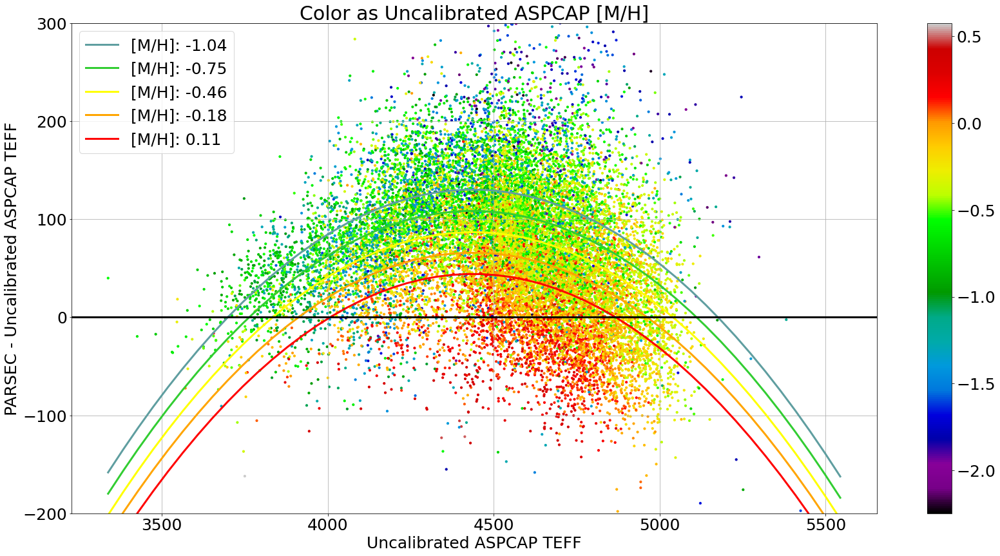

In [176]:
fincut = np.where((np.isfinite(low_ext_rgb['FPARAM'][:,0])==True)&(np.isfinite(low_ext_rgb['FPARAM'][:,3])==True)&
                  (np.isfinite(photteffs)==True))

popt, _ = curve_fit(teff_cal_me,(low_ext_rgb['FPARAM'][:,0][fincut],low_ext_rgb['FPARAM'][:,3][fincut]),
                    photteffs[fincut])

print(popt)

###
test_mhs = np.array([-1.04,-0.75,-0.46,-0.18,0.11])
colors_mhs = np.array(['cadetblue','limegreen','yellow','orange','red'])

plt.figure(figsize=[28,14])
plt.scatter(low_ext_rgb['FPARAM'][:,0],photteffs-low_ext_rgb['FPARAM'][:,0],
            c=low_ext_rgb['FPARAM'][:,3],cmap='nipy_spectral',s=10)

xs_teff = np.linspace(np.nanmin(low_ext_rgb['FPARAM'][:,0]),np.nanmax(low_ext_rgb['FPARAM'][:,0]))

for i in range(len(test_mhs)):
    plt.plot(xs_teff,teff_cal_me((xs_teff,test_mhs[i]),*popt)-xs_teff,lw=3.0,c=colors_mhs[i],
             label='[M/H]: {}'.format(test_mhs[i]))
    
plt.legend()

plt.colorbar()
plt.axhline(0.0,c='k',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as Uncalibrated ASPCAP [M/H]')
plt.xlabel(r'Uncalibrated ASPCAP TEFF')
plt.ylabel(r'PARSEC - Uncalibrated ASPCAP TEFF')
plt.savefig('../plots/photomettic_spectro_teff_trends.pdf',dpi=300,bbox_inches='tight')
plt.show()

In [177]:
popt

array([-4.64765892e+03,  2.11862786e+00, -2.38752778e-04, -7.47735851e+01])

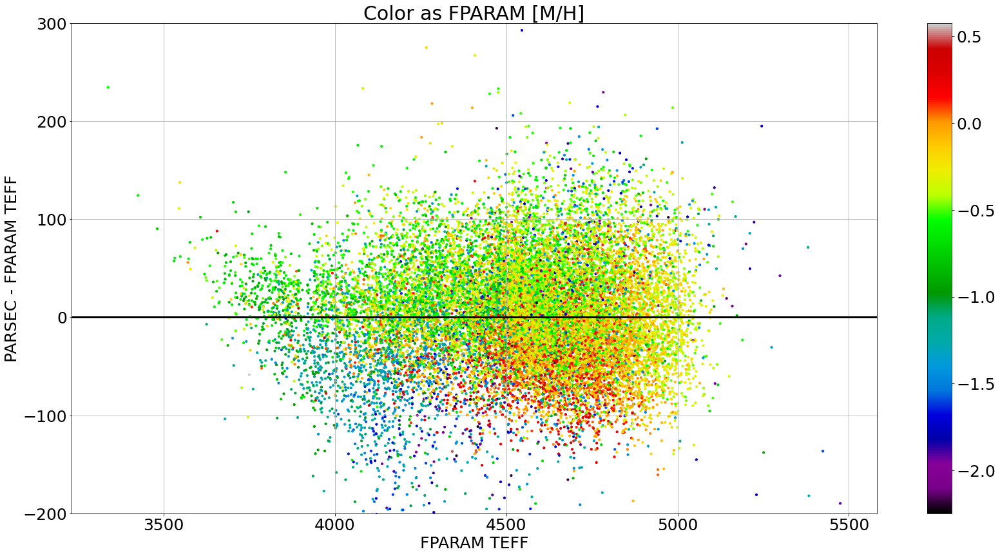

In [178]:
plt.figure(figsize=[28,14])
plt.scatter(low_ext_rgb['FPARAM'][:,0],
            photteffs-(teff_cal_me((low_ext_rgb['FPARAM'][:,0],low_ext_rgb['FPARAM'][:,3]),*popt)),
            c=low_ext_rgb['FPARAM'][:,3],cmap='nipy_spectral',s=10)

plt.colorbar()
plt.axhline(0.0,c='k',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as FPARAM [M/H]')
plt.xlabel(r'FPARAM TEFF')
plt.ylabel(r'PARSEC - FPARAM TEFF');

Median Residual:  -0.9669670005869193
Median Absolute Deviation:  36.13444323014983


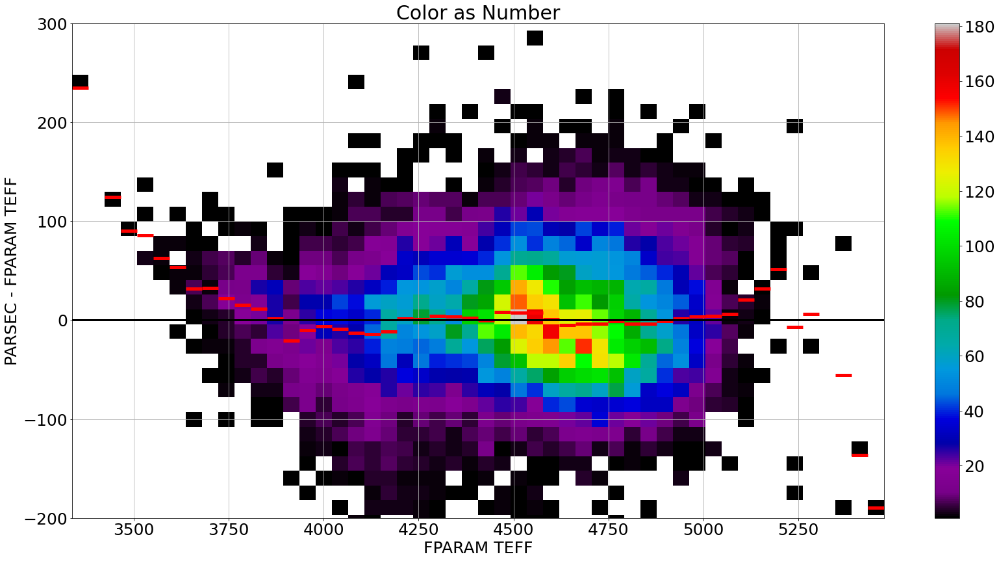

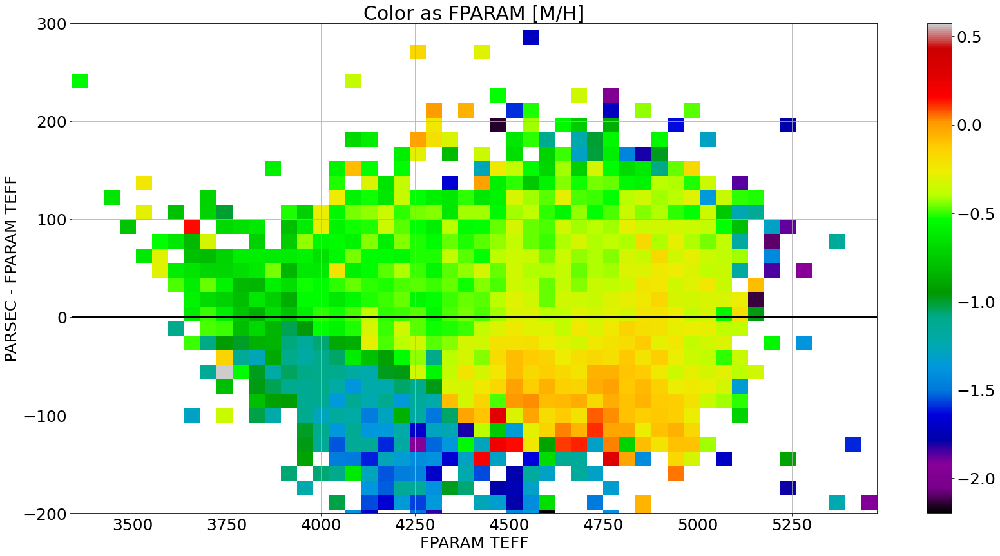

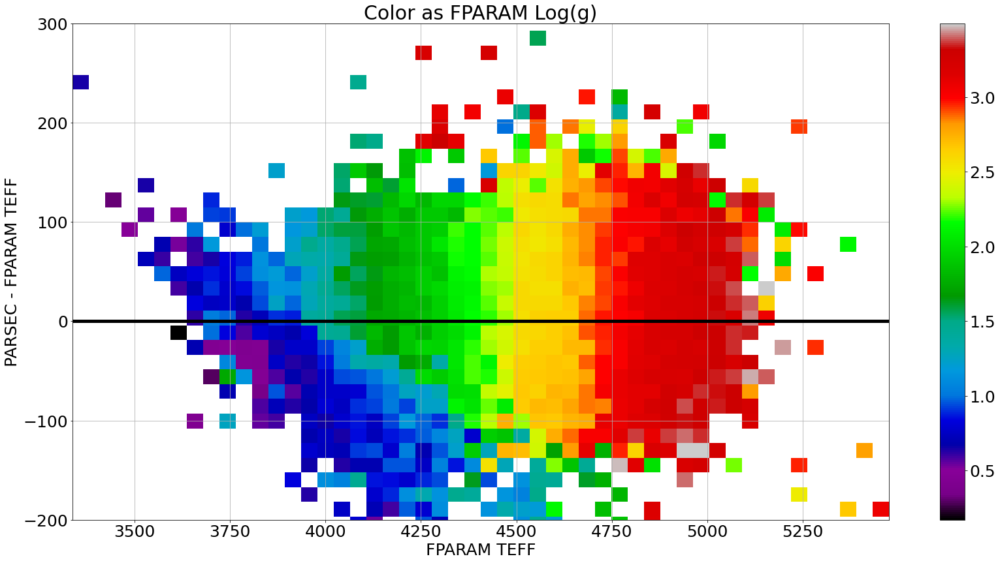

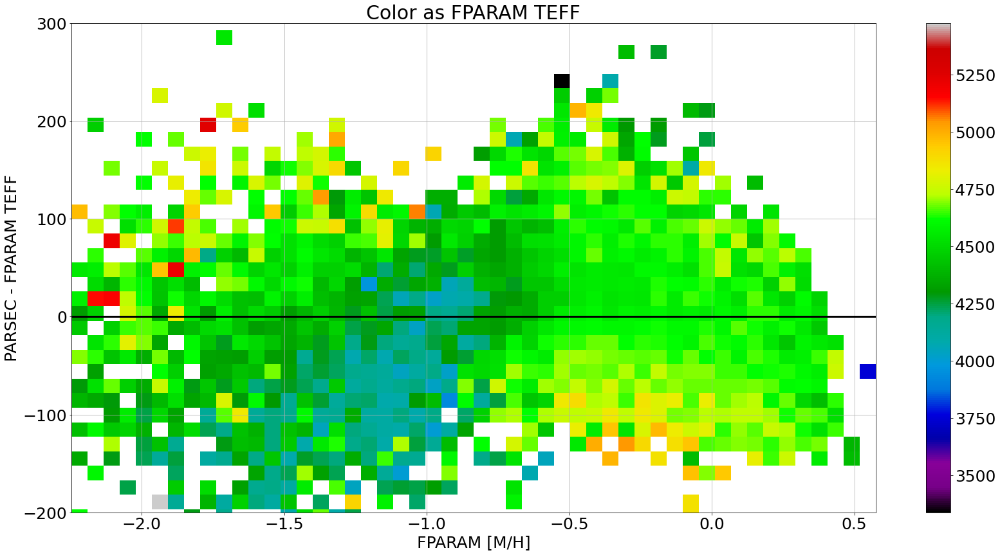

In [179]:
ret = binned_statistic_2d(low_ext_rgb['FPARAM'][:,0][fincut],
            (photteffs-(teff_cal_me((low_ext_rgb['FPARAM'][:,0],low_ext_rgb['FPARAM'][:,3]),*popt)))[fincut],
                          low_ext_rgb['FPARAM'][:,0][fincut],'count',bins=50)
ret.statistic[ret.statistic == 0.0] = np.nan

print('Median Residual: ',np.nanmedian((photteffs-(teff_cal_me((low_ext_rgb['FPARAM'][:,0],low_ext_rgb['FPARAM'][:,3]),*popt)))[fincut]))
print('Median Absolute Deviation: ',mad((photteffs-(teff_cal_me((low_ext_rgb['FPARAM'][:,0],low_ext_rgb['FPARAM'][:,3]),*popt)))[fincut]))

meds,edgs,_ = binned_statistic(low_ext_rgb['FPARAM'][:,0][fincut],
            (photteffs-(teff_cal_me((low_ext_rgb['FPARAM'][:,0],low_ext_rgb['FPARAM'][:,3]),*popt)))[fincut],
                               bins=50)

plt.figure(figsize=[28,14])

im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral')

plt.colorbar()
plt.hlines(meds,edgs[:-1],edgs[1:], colors='r', lw=5.)
plt.axhline(0.0,c='k',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as Number')
plt.xlabel(r'FPARAM TEFF')
plt.ylabel(r'PARSEC - FPARAM TEFF');

#####
ret = binned_statistic_2d(low_ext_rgb['FPARAM'][:,0][fincut],
            (photteffs-(teff_cal_me((low_ext_rgb['FPARAM'][:,0],low_ext_rgb['FPARAM'][:,3]),*popt)))[fincut],
                          low_ext_rgb['FPARAM'][:,3][fincut],'median',bins=50)
ret.statistic[ret.statistic == 0.0] = np.nan
plt.figure(figsize=[28,14])

im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral')

plt.colorbar()
plt.axhline(0.0,c='k',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as FPARAM [M/H]')
plt.xlabel(r'FPARAM TEFF')
plt.ylabel(r'PARSEC - FPARAM TEFF');

#####
ret = binned_statistic_2d(low_ext_rgb['FPARAM'][:,0][fincut],
            (photteffs-(teff_cal_me((low_ext_rgb['FPARAM'][:,0],low_ext_rgb['FPARAM'][:,3]),*popt)))[fincut],
                          low_ext_rgb['FPARAM'][:,1][fincut],'median',bins=50)
ret.statistic[ret.statistic == 0.0] = np.nan
plt.figure(figsize=[28,14])

im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral')

plt.colorbar()
plt.axhline(0.0,c='k',lw=5.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as FPARAM Log(g)')
plt.xlabel(r'FPARAM TEFF')
plt.ylabel(r'PARSEC - FPARAM TEFF');

#####
ret = binned_statistic_2d(low_ext_rgb['FPARAM'][:,3][fincut],
            (photteffs-(teff_cal_me((low_ext_rgb['FPARAM'][:,0],low_ext_rgb['FPARAM'][:,3]),*popt)))[fincut],
                          low_ext_rgb['FPARAM'][:,0][fincut],'median',bins=50)
ret.statistic[ret.statistic == 0.0] = np.nan
plt.figure(figsize=[28,14])

im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral')

plt.colorbar()
plt.axhline(0.0,c='k',lw=3.0)
plt.ylim(-200,300)
plt.grid()
plt.title(r'Color as FPARAM TEFF')
plt.xlabel(r'FPARAM [M/H]')
plt.ylabel(r'PARSEC - FPARAM TEFF');


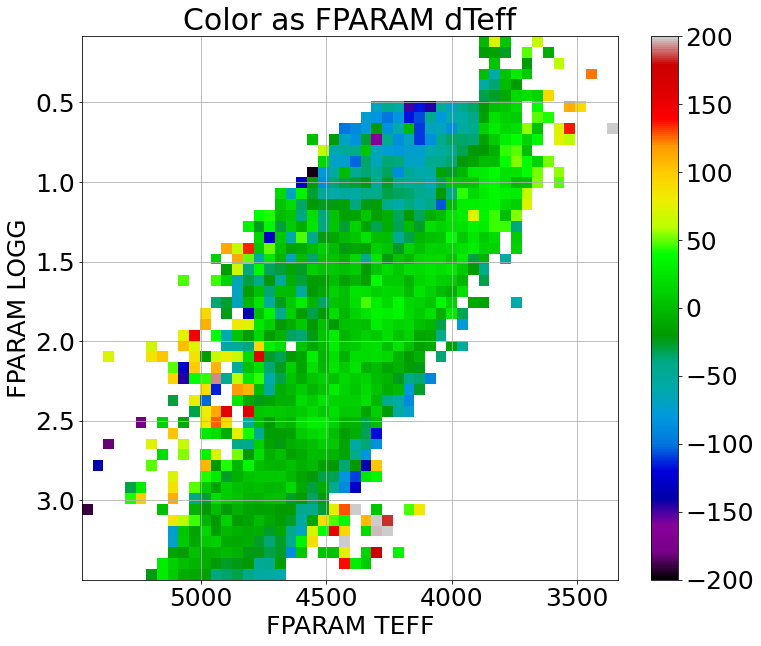

In [180]:
#####
ret = binned_statistic_2d(low_ext_rgb['FPARAM'][:,0][fincut],low_ext_rgb['FPARAM'][:,1][fincut],
            (photteffs-(teff_cal_me((low_ext_rgb['FPARAM'][:,0],low_ext_rgb['FPARAM'][:,3]),*popt)))[fincut],
                          'median',bins=50)
ret.statistic[ret.statistic == 0.0] = np.nan
plt.figure(figsize=[12,10])

im = plt.imshow(ret.statistic.T, origin='lower',
                    extent=[ret.x_edge[0],ret.x_edge[-1],ret.y_edge[0],ret.y_edge[-1]],
                    aspect='auto',interpolation='nearest',cmap='nipy_spectral',vmin=-200,vmax=200)

plt.colorbar()
plt.grid()

plt.gca().invert_xaxis()
plt.gca().invert_yaxis()

plt.title(r'Color as FPARAM dTeff')
plt.xlabel(r'FPARAM TEFF')
plt.ylabel(r'FPARAM LOGG');

In [181]:
np.median(rgb['TEFF_ERR'])

8.347048